In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

/bin/bash: nvidia-smi: command not found


#Library

In [ ]:
!pip install -qU python-gdcm pydicom pylibjpeg

In [ ]:
import os
import cv2
import glob
#import gdcm
import re
import shutil
#import pydicom
import shutil
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from tqdm.notebook import tqdm
from joblib import Parallel, delayed
from concurrent.futures import ProcessPoolExecutor
from PIL import Image

DEBUG = False

# Extract data

In [ ]:
#shutil.rmtree('/content/drive/MyDrive/Pfe/Breast')
#shutil.rmtree('/content/drive/MyDrive/Pfe/CMMD')
#shutil.rmtree('/content/drive/MyDrive/Pfe/Ddsm')
#shutil.rmtree('/content/drive/MyDrive/Pfe/MiniDDSM')
shutil.rmtree('/content/drive/MyDrive/Pfe_breast_cancer/Breast')
#shutil.rmtree('/content/drive/MyDrive/Pfe/output')

In [ ]:
# load files
data_path = '/content/drive/MyDrive/Pfe_breast_cancer/'


# Make sure that the output directory exists and is empty

#output_dir = os.path.join(data_path, 'MiniDDSM')
output_dir_rnsa = os.path.join(data_path, 'RSNA')
#output_dir_cmmd= os.path.join(data_path, 'TheChineseMammographyDatabase')

'''
if os.path.exists(output_dir_cmmd):
    shutil.rmtree(output_dir_cmmd)
os.makedirs(output_dir_cmmd)


if os.path.exists(output_dir):
    shutil.rmtree(output_dir)
os.makedirs(output_dir)

'''

if os.path.exists(output_dir_rnsa):
    shutil.rmtree(output_dir_rnsa)
os.makedirs(output_dir_rnsa)

# Unzip images

#shutil.unpack_archive(data_path + 'MiniDDSM JPEG DATASET.zip', output_dir)
#shutil.unpack_archive(data_path + 'TheChineseMammographyDatabase.zip',output_dir_cmmd )
shutil.unpack_archive(data_path + 'output.zip', output_dir_rnsa)





# Dicom -> Resized PNG/JPG

In [ ]:
train_images_cmmd = glob.glob("/content/drive/MyDrive/Pfe_breast_cancer/TheChineseMammographyDatabase/CMMD/*/*/*/*.dcm")

In [ ]:
rnsa = glob.glob("/content/drive/MyDrive/Pfe_breast_cancer/RSNA/*.png")

In [ ]:
len(rnsa)

54378

In [ ]:
for f in tqdm(train_images_cmmd[:4]):
    patient = f.split('/')[-4]
    idp = f.split('/')[-2]
    image = f.split('/')[-1][:-4]

    dicom = pydicom.dcmread(f)
    img = dicom.pixel_array

    img = (img - img.min()) / (img.max() - img.min())

    if dicom.PhotometricInterpretation == "MONOCHROME1":
        img = 1 - img

    plt.figure(figsize=(15, 15))
    plt.imshow(img, cmap="gray")
    plt.title(f"{patient} {idp} {image}")
    plt.show()

In [ ]:
SAVE_FOLDER = "/content/drive/MyDrive/Pfe_breast_cancer/output/cmmd/"
SIZE = 1024
EXTENSION = "png"

os.makedirs(SAVE_FOLDER, exist_ok=True)

In [ ]:
def process(f, size=512, save_folder="", extension="png"):
    patient = f.split('/')[-4]
    idp = f.split('/')[-2]
    image = f.split('/')[-1][:-4]

    dicom = pydicom.dcmread(f)
    img = dicom.pixel_array

    img = (img - img.min()) / (img.max() - img.min())

    if dicom.PhotometricInterpretation == "MONOCHROME1":
        img = 1 - img

    img = cv2.resize(img, (size, size))

    cv2.imwrite(save_folder + f"{patient}_{idp}_{image}.{extension}", (img * 255).astype(np.uint8))

In [ ]:
_ = Parallel(n_jobs=4)(
        delayed(process)(uid, size=SIZE, save_folder=SAVE_FOLDER, extension=EXTENSION)
    for uid in tqdm(train_images_cmmd)
)

  0%|          | 0/5202 [00:00<?, ?it/s]

In [ ]:
len(train_images_ddsm)

100

# RSNA: Cut Off Empty Space from Images



In [ ]:
breast_folder = "/content/drive/MyDrive/Pfe_breast_cancer/Breast/"
ddsm_folder = '/content/drive/MyDrive/Pfe_breast_cancer/Ddsm/'


os.makedirs(breast_folder, exist_ok=True)
os.makedirs(ddsm_folder, exist_ok=True)

## rsna

In [ ]:
all_images = glob.glob('/content/drive/MyDrive/Pfe_breast_cancer/Breast/*png')
#len(all_images)

In [ ]:
len(all_images)

65057

In [ ]:
def fit_image(fname):

      # Skip if the file is not an image file
    if not fname.endswith('.png'):
        print(f"Skipping non-image file: {fname}")
        return

    X = cv2.imread(fname)

    if X is None:
        print(f"Error reading image: {fname}")
        return

    # Some images have narrow exterior "frames" that complicate selection of the main data. Cutting off the frame
    X = X[5:-5, 5:-5]

    # regions of non-empty pixels
    output= cv2.connectedComponentsWithStats((X > 20).astype(np.uint8)[:, :, 0], 8, cv2.CV_32S)

    # stats.shape == (N, 5), where N is the number of regions, 5 dimensions correspond to:
    # left, top, width, height, area_size
    stats = output[2]

    # finding max area which always corresponds to the breast data.
    idx = stats[1:, 4].argmax() + 1
    x1, y1, w, h = stats[idx][:4]
    x2 = x1 + w
    y2 = y1 + h

    # cutting out the breast data
    X_fit = X[y1: y2, x1: x2]

    patient_id, im_id = re.findall('(\d+)_(\d+).png', os.path.basename(fname))[0]
    #os.makedirs('Breast/' +patient_id, exist_ok=True)
    cv2.imwrite(f'/content/drive/MyDrive/Pfe_breast_cancer/Breast/{patient_id}_{im_id}.png', X_fit[:, :, 0])



def fit_all_images(all_images):
    with ProcessPoolExecutor(4) as p:
        for i in tqdm(p.map(fit_image, all_images), total=len(all_images)):
            pass

In [ ]:
all_images = glob.glob("/content/drive/MyDrive/Pfe_breast_cancer/RSNA/*.png")
if DEBUG:
    all_images = np.random.choice(all_images, size=100)
fit_all_images(all_images)

  0%|          | 0/54378 [00:00<?, ?it/s]

In [ ]:
os.makedirs('/content/drive/MyDrive/Pfe_breast_cancer/dataset/', exist_ok=True)
df = pd.DataFrame(columns=['patient_id','image_id', 'File_name', 'path'])
for fname in (all_images):

    patient_id, im_id = re.findall('(\d+)_(\d+).png', os.path.basename(fname))[0]
    path = f'/content/drive/MyDrive/Pfe_breast_cancer/Breast/{patient_id}_{im_id}.png'
    File_name=f'{patient_id}_{im_id}.png'
    df = df.append({'patient_id': patient_id,'image_id': im_id, 'File_name':File_name, 'path': path}, ignore_index=True)
df.to_csv("/content/drive/MyDrive/Pfe_breast_cancer/dataset/rsna.csv", index=False)
df = pd.read_csv("/content/drive/MyDrive/Pfe_breast_cancer/dataset/rsna.csv")
df

In [ ]:
df

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Pfe_breast_cancer/dataset/rsna.csv")
df_rsna = pd.read_csv("/content/drive/MyDrive/Pfe_breast_cancer/dataset-info/train-2.csv")
merged_rsna = pd.merge(df_rsna, df, on='image_id')
columns = ['patient_id_x', 'File_name', 'cancer','path']
merged_rsna = merged_rsna[columns]
merged_rsna = merged_rsna.rename(columns={'patient_id_x': 'Patient_id', 'image_id': 'Image_id', 'cancer': 'Cancer' , 'path': 'Path'})
merged_rsna = merged_rsna.rename(columns={ 'File_name': 'Image_id'})
merged_rsna.to_csv("/content/drive/MyDrive/Pfe_breast_cancer/dataset/merged_rsna.csv", index=False)

merged_rsna

## Ddsm

In [ ]:
all_images = glob.glob('/content/drive/MyDrive/Pfe_breast_cancer/MiniDDSM/*/*/*')
#os.makedirs(output_folder, exist_ok=True)  # Create the output folder if it doesn't exist

for image_path in all_images:
    file_name = os.path.basename(image_path)
    output_path = os.path.join('/content/drive/MyDrive/Pfe_breast_cancer/Ddsm/', file_name)
    shutil.copy(image_path, output_path)

In [ ]:
def fit_image(fname):

    # Skip if the file is not an image file
    if not fname.endswith('.jpg'):
        print(f"Skipping non-image file: {fname}")
        return

    X = cv2.imread(fname)

    if X is None:
        print(f"Error reading image: {fname}")
        return

    # Some images have narrow exterior "frames" that complicate selection of the main data. Cutting off the frame
    X = X[5:-5, 5:-5]



    # regions of non-empty pixels
    output= cv2.connectedComponentsWithStats((X > 30).astype(np.uint8)[:, :, 0], 8, cv2.CV_32S)

    # stats.shape == (N, 5), where N is the number of regions, 5 dimensions correspond to:
    # left, top, width, height, area_size
    stats = output[2]

    # finding max area which always corresponds to the breast data.
    idx = stats[1:, 4].argmax() + 1
    x1, y1, w, h = stats[idx][:4]
    x2 = x1 + w
    y2 = y1 + h

    # cutting out the breast data
    X_fit = X[y1: y2, x1: x2]

    #print(fname)
    match = re.findall(r"(\w+)\.(\w+)_(\w+)\.jpg", os.path.basename(fname))
    #print(match)
    patient_id = match[0][0]
    types = match[0][1]
    area = match[0][2]
    #pict = match[0][2]

    #os.makedirs('Breast/' + patient_id, exist_ok=True)
    cv2.imwrite(f'/content/drive/MyDrive/Pfe_breast_cancer/Breast/{patient_id}.{types}_{area}.png', X_fit[:, :, 0])
    #path = f'{patient_id}/{types}/{area}.png'

    # create a pandas dataframe to store patient_id, idp, and im_id


def fit_all_images(all_images):
    with ProcessPoolExecutor(4) as p:
        for i in tqdm(p.map(fit_image, all_images), total=len(all_images)):
            pass

In [ ]:
all_images = glob.glob('/content/drive/MyDrive/Pfe_breast_cancer/Ddsm/*')
if DEBUG:
    all_images = np.random.choice(all_images, size=100)
fit_all_images(all_images)

  0%|          | 0/5627 [00:00<?, ?it/s]

Skipping non-image file: /content/drive/MyDrive/Pfe_breast_cancer/Ddsm/desktop.ini


In [ ]:
np.random.seed(123)

for fname in np.random.choice(glob.glob('/content/drive/MyDrive/Pfe_breast_cancer/Breast/*'), size=100):
    plt.figure(figsize=(10, 10))
    #patient_id, im_id = re.findall('(\d+)/(\d+).png', fname)[0]

    match = re.findall(r"(\w+)\.(\w+)_(\w+)\.png", os.path.basename(fname))
    #print(match)
    patient_id = match[0][0]
    types = match[0][1]
    area = match[0][2]

    plt.suptitle(f'[{fname}]')
    im1 = Image.open(fname).convert('F')
    plt.subplot(121).imshow(im1)
    plt.subplot(121).set_title(f'Output image {im1.size}')
    #print(patient_id)

    im2 = Image.open(f'/content/drive/MyDrive/Pfe_breast_cancer/Ddsm/{patient_id}.{types}_{area}.jpg').convert('F')
    plt.subplot(122).imshow(
        im2
    )
    plt.subplot(122).set_title(f'Source image {im2.size}')

In [ ]:
all_images = glob.glob('/content/drive/MyDrive/Pfe_breast_cancer/Ddsm/*')
len(all_images)

5627

In [ ]:
#os.makedirs('/content/drive/MyDrive/Pfe/dataset/', exist_ok=True)
all_images = glob.glob('/content/drive/MyDrive/Pfe_breast_cancer/Ddsm/*')
df = pd.DataFrame(columns=['patient_id','types','area', 'path','img_rename'])
for fname in (all_images):

    if not os.path.isfile(fname) or not fname.endswith('.jpg'):
        continue

    match = re.findall(r"(\w+)\.(\w+)_(\w+)\.jpg", os.path.basename(fname))
    #print('match all_images all_images', match)
    patient_id = match[0][0]

    types = match[0][1]
    area = match[0][2]

    path = f'/content/drive/MyDrive/Pfe_breast_cancer/Breast/{patient_id}_{types}_{area}.png'
    img = f'{patient_id}.{types}_{area}.png'
    img_rename = f'{patient_id}.{types}_{area}.png'
    df = df.append({'patient_id': patient_id, 'types': types, 'area': area,'fileName': img, 'path': path, 'img_rename':img_rename }, ignore_index=True)
df.to_csv("/content/drive/MyDrive/Pfe_breast_cancer/dataset/ddsm.csv", index=False)

In [ ]:
df

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Pfe_breast_cancer/dataset/ddsm.csv")
df_ddsm = pd.read_excel("/content/drive/MyDrive/Pfe_breast_cancer/dataset-info/Data-MoreThanTwoMasks.xlsx")
merged_ddsm = pd.merge(df_ddsm, df, on='fileName')
columns = ['patient_id', 'Status','path', 'img_rename']
merged_ddsm = merged_ddsm[columns]
merged_ddsm = merged_ddsm.rename(columns={'patient_id': 'Patient_id', 'fileName': 'Image_id', 'Status': 'Cancer' , 'path': 'Path'})
mapping = {'Benign': 0, 'Cancer': 1,}
# Perform ordinal encoding
merged_ddsm['Cancer'] = merged_ddsm['Cancer'].map(mapping)
merged_ddsm = merged_ddsm.rename(columns={'img_rename': 'Image_id'})


merged_ddsm.to_csv("/content/drive/MyDrive/Pfe_breast_cancer/dataset/merged_ddsm.csv", index=False)
merged_ddsm

,Patient_id,Cancer,Path,Image_id
0,C_0029_1,0,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,C_0029_1.LEFT_CC.png
1,C_0029_1,0,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,C_0029_1.LEFT_MLO.png
2,C_0029_1,0,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,C_0029_1.RIGHT_CC.png
3,C_0029_1,0,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,C_0029_1.RIGHT_MLO.png
4,C_0033_1,0,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,C_0033_1.LEFT_CC.png
...,...,...,...,...
5386,D_4193_1,1,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,D_4193_1.RIGHT_MLO.png
5387,D_4199_1,1,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,D_4199_1.LEFT_CC.png
5388,D_4199_1,1,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,D_4199_1.LEFT_MLO.png
5389,D_4199_1,1,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,D_4199_1.RIGHT_CC.png


## cmmd

In [ ]:
def fit_image(fname):
    X = cv2.imread(fname)

    df = pd.DataFrame(columns=['patient_id', 'idp', 'im_id', 'path'])

    # Some images have narrow exterior "frames" that complicate selection of the main data. Cutting off the frame
    X = X[5:-5, 5:-5]

    # regions of non-empty pixels
    output= cv2.connectedComponentsWithStats((X > 20).astype(np.uint8)[:, :, 0], 8, cv2.CV_32S)

    # stats.shape == (N, 5), where N is the number of regions, 5 dimensions correspond to:
    # left, top, width, height, area_size
    stats = output[2]

    # finding max area which always corresponds to the breast data.
    idx = stats[1:, 4].argmax() + 1
    x1, y1, w, h = stats[idx][:4]
    x2 = x1 + w
    y2 = y1 + h

    # cutting out the breast data
    X_fit = X[y1: y2, x1: x2]


    match = re.findall(r"(D\d+)-(\d+)_([\d\.]+)-(\w+)-(\d+)_(\d+)-(\d+)\.png", os.path.basename(fname))
    patient_id = match[0][0] + "-" + match[0][1]
    idp = match[0][2] + "-" + match[0][3] + "-" + match[0][4]
    im_id = match[0][5] + "-" + match[0][6]
    #os.makedirs('Breast/' + patient_id, exist_ok=True)
    cv2.imwrite(f'/content/drive/MyDrive/Pfe_breast_cancer/Breast/{patient_id}_{idp}_{im_id}.png', X_fit[:, :, 0])

def fit_all_images(all_images):
    with ProcessPoolExecutor(4) as p:
        for i in tqdm(p.map(fit_image, all_images), total=len(all_images)):
            pass

In [ ]:
#all_images = glob.glob('/kaggle/input/rsna-breast-cancer-1024-pngs/output/*')[:20]
all_images = glob.glob('/content/drive/MyDrive/Pfe_breast_cancer/output/cmmd/*')
if DEBUG:
    all_images = np.random.choice(all_images, size=100)
fit_all_images(all_images)

  0%|          | 0/5053 [00:00<?, ?it/s]

In [ ]:
all_images = glob.glob('/content/drive/MyDrive/Pfe_breast_cancer/output/cmmd/*')


In [ ]:
os.makedirs('/content/drive/MyDrive/Pfe_breast_cancer/dataset/', exist_ok=True)
df = pd.DataFrame(columns=['ID1', 'im_id', 'path'])
for fname in (all_images):

    match = re.findall(r"(D\d+)-(\d+)_([\d\.]+)-(\w+)-(\d+)_(\d+)-(\d+)\.png", os.path.basename(fname))
    #print(match)
    patient_id = match[0][0] + "-" + match[0][1]
    idp = match[0][2] + "-" + match[0][3] + "-" + match[0][4]
    im_id = match[0][5] + "-" + match[0][6]
    path = f'/content/drive/MyDrive/Pfe_breast_cancer/Breast/{patient_id}_{idp}_{im_id}.png'
    img = f'{patient_id}_{idp}_{im_id}.png'
    df = df.append({'ID1': patient_id, 'im_id':img , 'path': path}, ignore_index=True)
df.to_csv("/content/drive/MyDrive/Pfe_breast_cancer/dataset/cmmd.csv", index=False)

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Pfe_breast_cancer/dataset/cmmd.csv")
df_ccmd = pd.read_excel("/content/drive/MyDrive/Pfe_breast_cancer/dataset-info/CMMD_clinicaldata_revision.xlsx")
merged_ccmd = pd.merge(df_ccmd, df, on='ID1')
columns = ['ID1', 'classification', 'im_id','path']
merged_ccmd = merged_ccmd[columns]
merged_ccmd = merged_ccmd.rename(columns={'ID1': 'Patient_id', 'im_id': 'Image_id', 'classification': 'Cancer' , 'path': 'Path'})
mapping = {'Benign': 0, 'Malignant': 1,}
# Perform ordinal encoding
merged_ccmd['Cancer'] = merged_ccmd['Cancer'].map(mapping)
merged_ccmd.to_csv("/content/drive/MyDrive/Pfe_breast_cancer/dataset/merged_ccmd.csv", index=False)

merged_ccmd

,Patient_id,Cancer,Image_id,Path
0,D1-0001,0,D1-0001_1.000000-NA-70244_1-1.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
1,D1-0001,0,D1-0001_1.000000-NA-70244_1-2.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
2,D1-0002,0,D1-0002_1.000000-NA-45313_1-1.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
3,D1-0002,0,D1-0002_1.000000-NA-45313_1-2.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
4,D1-0003,0,D1-0003_1.000000-NA-24283_1-1.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
...,...,...,...,...
5423,D2-0748,1,D2-0748_1.000000-NA-09459_1-4.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
5424,D2-0749,1,D2-0749_1.000000-NA-15082_1-1.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
5425,D2-0749,1,D2-0749_1.000000-NA-15082_1-3.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
5426,D2-0749,1,D2-0749_1.000000-NA-15082_1-2.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...


In [ ]:
np.random.seed(123)

for fname in np.random.choice(glob.glob('*/*'), size=100):
    plt.figure(figsize=(20, 10))
    patient_id, im_id = re.findall('(\d+)/(\d+).png', fname)[0]
    plt.suptitle(f'[{fname}]')
    im1 = Image.open(fname).convert('F')
    plt.subplot(121).imshow(im1)
    plt.subplot(121).set_title(f'Output image {im1.size}')
    im2 = Image.open(f'/content/drive/MyDrive/Pfe_breast_cancer/rsna-breast-cancer-1024-pngs/output/{patient_id}_{im_id}.png').convert('F')
    plt.subplot(122).imshow(
        im2
    )
    plt.subplot(122).set_title(f'Source image {im2.size}')

In [ ]:
import pandas as pd
df = pd.DataFrame(dict(zip(('y', 'x', 'c'), cv2.imread(i).shape)) for i in glob.glob('*/*.png'))

In [ ]:
df[['x', 'y']].plot.hist(alpha=0.7, bins=100)

# Concate data frame

In [ ]:
all_images = glob.glob('/content/drive/MyDrive/Pfe_breast_cancer/Breast/*png')
len(all_images)

65057

In [ ]:
all_images

[]

In [ ]:
df_cmmd = pd.read_csv("/content/drive/MyDrive/Pfe_breast_cancer/dataset/merged_ccmd.csv")
df_rsna = pd.read_csv("/content/drive/MyDrive/Pfe_breast_cancer/dataset/merged_rsna.csv")
df_ddsm = pd.read_csv("/content/drive/MyDrive/Pfe_breast_cancer/dataset/merged_ddsm.csv")

In [ ]:
df = pd.concat([df_cmmd, df_ddsm,df_rsna ], axis=0)

df.to_csv("/content/drive/MyDrive/Pfe_breast_cancer/dataset/train.csv", index=False)
df

,Patient_id,Cancer,Image_id,Path
0,D1-0001,0,D1-0001_1.000000-NA-70244_1-1.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
1,D1-0001,0,D1-0001_1.000000-NA-70244_1-2.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
2,D1-0002,0,D1-0002_1.000000-NA-45313_1-1.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
3,D1-0002,0,D1-0002_1.000000-NA-45313_1-2.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
4,D1-0003,0,D1-0003_1.000000-NA-24283_1-1.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
...,...,...,...,...
54373,9973,0,9973_1729524723.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
54374,9989,0,9989_63473691.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
54375,9989,0,9989_1078943060.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
54376,9989,0,9989_398038886.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...


In [ ]:
cancer_counts = df['Cancer'].value_counts()

# Get the count of cancer label 1 (cancer present)
cancer_present_count = cancer_counts[1]

# Get the count of cancer label 0 (cancer not present)
cancer_not_present_count = cancer_counts[0]

# Plot the count of cancer labels
labels = ['Presence d\'un cancer', 'Absence d\'un cancer']
counts = [cancer_present_count, cancer_not_present_count]

plt.bar(labels, counts)
plt.ylabel('Nombre de données')
plt.show()

In [ ]:
#df['Image_id'] = df['Path'].apply(lambda path: path.split('/')[-1])

# Filter the DataFrame to keep only the rows where Image_id is present in all_images
df_filtered = df[df['Path'].isin(all_images)]

# Remove the 'Image_id' column if needed
#df_filtered = df_filtered.drop('Image_id', axis=1)

# Save the filtered DataFrame back to the CSV file
df_filtered.to_csv("/content/drive/MyDrive/Pfe_breast_cancer/dataset/train_filtered.csv", index=False)

df_filtered

,Patient_id,Cancer,Image_id,Path
0,D1-0001,0,D1-0001_1.000000-NA-70244_1-1.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
1,D1-0001,0,D1-0001_1.000000-NA-70244_1-2.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
2,D1-0002,0,D1-0002_1.000000-NA-45313_1-1.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
3,D1-0002,0,D1-0002_1.000000-NA-45313_1-2.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
4,D1-0003,0,D1-0003_1.000000-NA-24283_1-1.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
...,...,...,...,...
54373,9973,0,9973_1729524723.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
54374,9989,0,9989_63473691.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
54375,9989,0,9989_1078943060.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
54376,9989,0,9989_398038886.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...


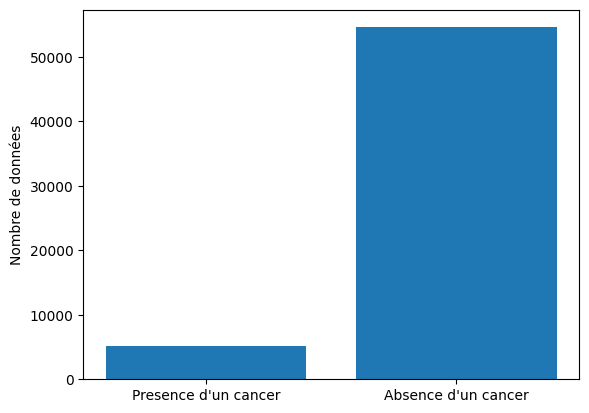

In [ ]:
cancer_counts = df_filtered['Cancer'].value_counts()

# Get the count of cancer label 1 (cancer present)
cancer_present_count = cancer_counts[1]

# Get the count of cancer label 0 (cancer not present)
cancer_not_present_count = cancer_counts[0]

# Plot the count of cancer labels
labels = ['Presence d\'un cancer', 'Absence d\'un cancer']
counts = [cancer_present_count, cancer_not_present_count]

plt.bar(labels, counts)
plt.ylabel('Nombre de données')
plt.show()

In [ ]:
selected_df = df_filtered[df_filtered['Cancer'] == 1]
selected_df

,Patient_id,Cancer,Image_id,Path
96,D1-0045,1,D1-0045_1.000000-NA-76622_1-1.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
97,D1-0045,1,D1-0045_1.000000-NA-76622_1-2.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
98,D1-0046,1,D1-0046_1.000000-NA-89305_1-1.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
99,D1-0046,1,D1-0046_1.000000-NA-89305_1-2.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
100,D1-0047,1,D1-0047_1.000000-NA-59605_1-1.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
...,...,...,...,...
54157,9707,1,9707_1900919592.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
54265,9840,1,9840_111786935.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
54266,9840,1,9840_1559360810.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
54267,9851,1,9851_1409270544.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...


In [ ]:
df_filtered_frac = df_filtered[df_filtered['Cancer'] == 0].sample(frac = 1)
selected_df_1 = df_filtered_frac[df_filtered_frac['Cancer'] == 0][:19774]
selected_df_1

,Patient_id,Cancer,Image_id,Path
48111,62033,0,62033_2097547215.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
13812,2480,0,2480_2093169211.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
11945,22800,0,22800_1957550184.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
50707,6499,0,6499_159482673.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
4230,14552,0,14552_788632064.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
...,...,...,...,...
38530,51776,0,51776_338558061.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
46427,60244,0,60244_940818929.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
48653,62807,0,62807_1749459764.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
48941,63138,0,63138_103184038.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...


In [ ]:
combined_df = pd.concat([selected_df_1, selected_df], ignore_index=True)
combined_df.to_csv("/content/drive/MyDrive/Pfe_breast_cancer/dataset/train_combined_df.csv", index=False)

combined_df

,Patient_id,Cancer,Image_id,Path
0,62033,0,62033_2097547215.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
1,2480,0,2480_2093169211.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
2,22800,0,22800_1957550184.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
3,6499,0,6499_159482673.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
4,14552,0,14552_788632064.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
...,...,...,...,...
24995,9707,1,9707_1900919592.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
24996,9840,1,9840_111786935.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
24997,9840,1,9840_1559360810.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
24998,9851,1,9851_1409270544.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...


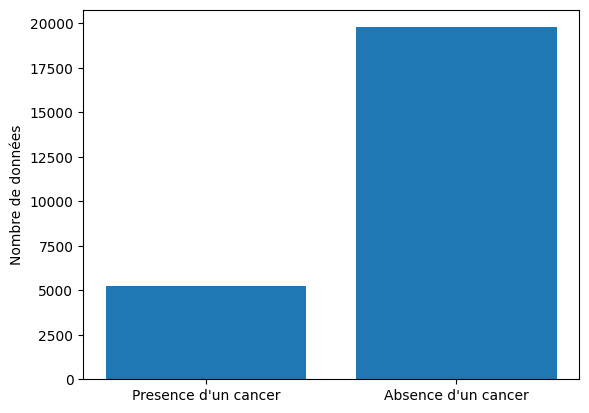

In [ ]:
cancer_counts = combined_df['Cancer'].value_counts()

# Get the count of cancer label 1 (cancer present)
cancer_present_count = cancer_counts[1]

# Get the count of cancer label 0 (cancer not present)
cancer_not_present_count = cancer_counts[0]

# Plot the count of cancer labels
labels = ['Presence d\'un cancer', 'Absence d\'un cancer']
counts = [cancer_present_count, cancer_not_present_count]

plt.bar(labels, counts)
plt.ylabel('Nombre de données')
plt.show()

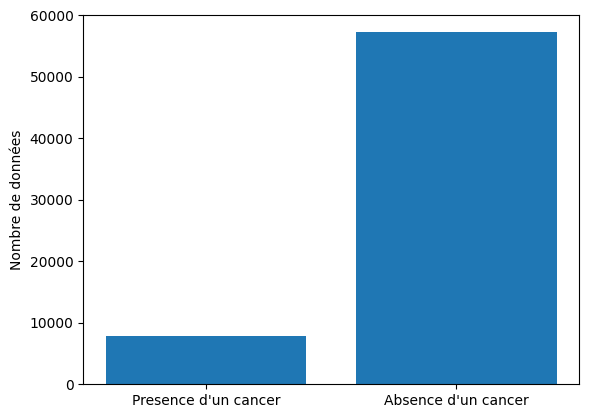

In [ ]:
cancer_counts = df['Cancer'].value_counts()

# Get the count of cancer label 1 (cancer present)
cancer_present_count = cancer_counts[1]

# Get the count of cancer label 0 (cancer not present)
cancer_not_present_count = cancer_counts[0]

# Plot the count of cancer labels
labels = ['Presence d\'un cancer', 'Absence d\'un cancer']
counts = [cancer_present_count, cancer_not_present_count]

plt.bar(labels, counts)
plt.ylabel('Nombre de données')
plt.show()

In [ ]:
cancer_present_count

7933

In [ ]:
cancer_not_present_count

57264

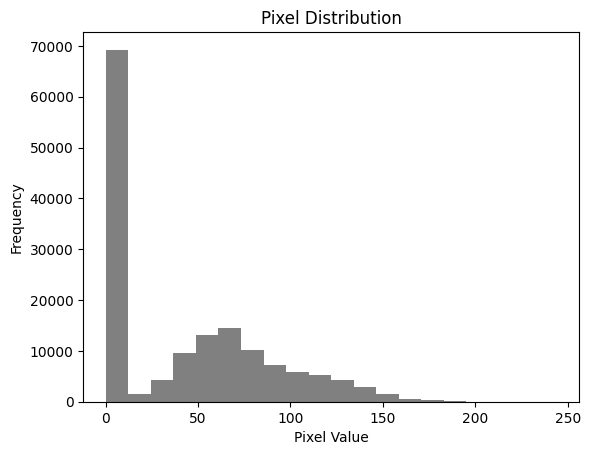

In [ ]:
# Load the image
image_path = '/content/drive/MyDrive/Pfe_breast_cancer/Breast/D1-0001_1.000000-NA-70244_1-1.png'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Flatten the image to a 1D array
pixels = image.flatten()

# Plot the pixel distribution
plt.hist(pixels, bins=20, color='gray')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.title('Pixel Distribution')
plt.show()

<ipython-input-56-0d1ee5ac181f>:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap('jet')


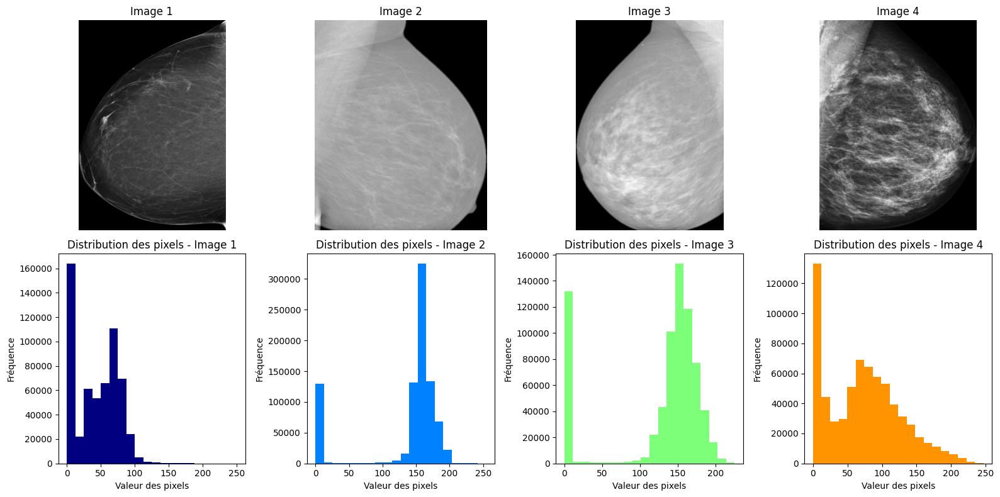

In [ ]:
import random
from matplotlib.cm import get_cmap

# Randomly choose 4 image paths
random_image_paths = random.sample(df['Path'].tolist(), 4)



# Create subplots
fig, axes = plt.subplots(2, 4, figsize=(16, 8))

# Get the "jet" colormap
cmap = get_cmap('jet')

# Iterate over the selected image paths
for i, image_path in enumerate(random_image_paths):
    # Load the image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Flatten the image to a 1D array
    pixels = image.flatten()

    # Plot the image
    axes[0, i].imshow(image, cmap='gray')
    axes[0, i].axis('off')
    axes[0, i].set_title(f'Image {i+1}')

    # Plot the pixel distribution with colors from the "jet" colormap
    axes[1, i].hist(pixels, bins=20, color=cmap(i / 4))
    axes[1, i].set_xlabel('Valeur des pixels')
    axes[1, i].set_ylabel('Fréquence')
    axes[1, i].set_title(f'Distribution des pixels - Image {i+1}')


# Adjust the spacing between subplots
plt.tight_layout()

# Display the subplots
plt.show()

# From scratch


## Library


In [ ]:
!pip install --upgrade timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 61.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.5/268.5 kB 27.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 63.0 MB/s eta 0:00:00


In [ ]:
# Get the list of available models
model_names = timm.list_models(pretrained=True)
model_names

In [ ]:

# ====================================================
# Library
# ====================================================
import sys
#sys.path.append('../input/pytorch-image-models/pytorch-image-models-master')

import os
import gc
import math
import time
import random
import shutil
from pathlib import Path
from contextlib import contextmanager
from collections import defaultdict, Counter

import scipy as sp
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


from sklearn import preprocessing
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold, GroupKFold, KFold
from sklearn.model_selection import train_test_split

from tqdm.auto import tqdm
from functools import partial

import cv2
from PIL import Image
import albumentations as A


import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import Adam, SGD, AdamW
import torchvision.models as models
from torch.nn.parameter import Parameter
from torch.utils.data import DataLoader, Dataset
from torch.optim.lr_scheduler import CosineAnnealingWarmRestarts, CosineAnnealingLR, ReduceLROnPlateau

'''
from albumentations import (
    Compose, OneOf, Normalize, Resize, RandomResizedCrop, RandomCrop, HorizontalFlip, VerticalFlip,
    RandomBrightness, RandomContrast, RandomBrightnessContrast, Rotate, ShiftScaleRotate, Cutout,
    IAAAdditiveGaussianNoise, Transpose
    )
'''
from albumentations.pytorch import ToTensorV2
from albumentations import ImageOnlyTransform

import timm

from sklearn.metrics import mean_squared_error
from torch.cuda.amp import autocast, GradScaler

import warnings
warnings.filterwarnings('ignore')

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

## Data Loading¶

In [ ]:
# Set seed for reproducability
SEED = 70

# load files
data_path = '/content/drive/MyDrive/Pfe_breast_cancer/dataset/'
train = pd.read_csv(data_path + 'train_combined_df.csv')
train = train.sample(frac = 1)


#train = pd.read_csv(data_path + 'train.csv')
#columns = ['Image_id', 'Cancer']
#train = train[columns][:25000]


#test = pd.read_csv(data_path + 'Test.csv')
#sample_submission = pd.read_csv(data_path + 'SampleSubmission.csv')

# Make sure that the output directory exists and is empty

# Preview train
train

,Patient_id,Cancer,Image_id,Path
24100,2346,1,2346_129609192.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
9492,15550,0,15550_1763899186.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
10553,64567,0,64567_1512397919.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
12436,13211,0,13211_306711091.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
7098,63700,0,63700_925890690.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
...,...,...,...,...
13509,45482,0,45482_1449264018.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
21163,D2-0070,1,D2-0070_1.000000-NA-18176_1-3.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
16233,10198,0,10198_1273945534.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...
24348,3542,1,3542_593840512.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...


In [ ]:
#train=train.dropna(subset=['Image_id'])
train['Image_id'].isnull().sum()

0

In [ ]:
target_distribution = train['Cancer'].value_counts(normalize=True)

# Split the data based on the target distribution
train_data, test_data = train_test_split(train, test_size=0.05, stratify=train['Cancer'], random_state=42)


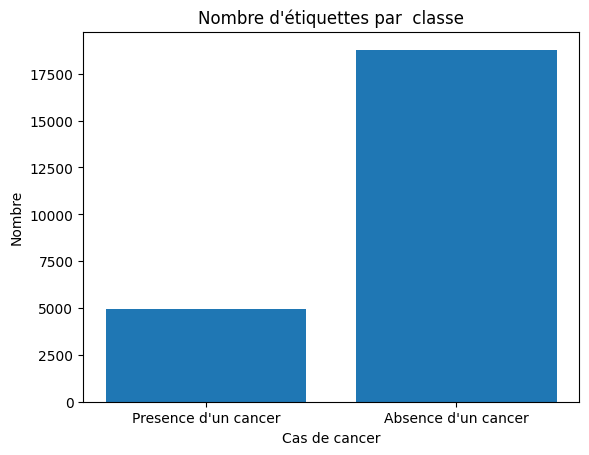

In [ ]:
cancer_counts = train_data['Cancer'].value_counts()

# Get the count of cancer label 1 (cancer present)
cancer_present_count = cancer_counts[1]

# Get the count of cancer label 0 (cancer not present)
cancer_not_present_count = cancer_counts[0]

# Plot the count of cancer labels
labels = ['Presence d\'un cancer', 'Absence d\'un cancer']
counts = [cancer_present_count, cancer_not_present_count]

plt.bar(labels, counts)
plt.xlabel('Cas de cancer')
plt.ylabel('Nombre')
plt.title('Nombre d\'étiquettes par  classe')
plt.show()

In [ ]:
cancer_present_count, cancer_not_present_count

(4965, 18785)

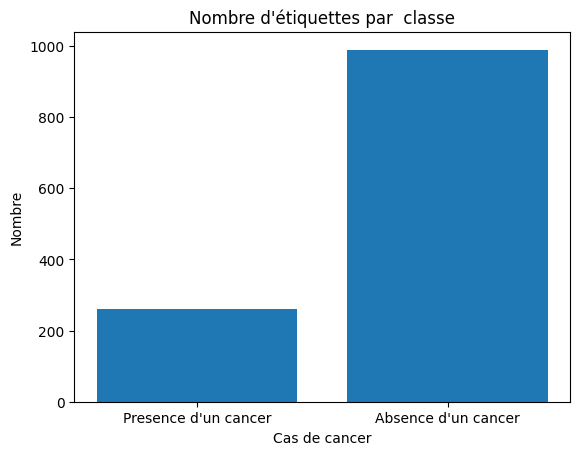

In [ ]:
cancer_counts = test_data['Cancer'].value_counts()

# Get the count of cancer label 1 (cancer present)
cancer_present_count = cancer_counts[1]

# Get the count of cancer label 0 (cancer not present)
cancer_not_present_count = cancer_counts[0]

# Plot the count of cancer labels
labels = ['Presence d\'un cancer', 'Absence d\'un cancer']
counts = [cancer_present_count, cancer_not_present_count]

plt.bar(labels, counts)
plt.xlabel('Cas de cancer')
plt.ylabel('Nombre')
plt.title('Nombre d\'étiquettes par  classe')
plt.show()

In [ ]:
cancer_present_count, cancer_not_present_count

(261, 989)

In [ ]:
train = train_data
train

,Image_id,Cancer
16831,22248_1373641175.png,0
53854,62530_1982266251.png,0
55294,6410_945417601.png,0
27289,33332_1225833551.png,0
57598,7511_1066645077.png,0
...,...,...
45377,53388_1363412528.png,0
54176,62945_1421305744.png,0
8356,13124_501459225.png,0
16538,21923_138972646.png,1


## Directory settings

In [ ]:
# ====================================================
# Directory settings
# ====================================================
import os

OUTPUT_DIR = '/content/drive/MyDrive/Pfe_breast_cancer/Breast_model/'
if not os.path.exists(OUTPUT_DIR):
    os.makedirs(OUTPUT_DIR)

TRAIN_PATH = '/content/drive/MyDrive/Pfe_breast_cancer/Breast'



## CFG

In [ ]:
'''
 'convnext_small.fb_in1k',
 'convnext_small.fb_in22k',
 'convnext_small.fb_in22k_ft_in1k',
 'convnext_small.fb_in22k_ft_in1k_384',
 'convnext_small.in12k',
 'convnext_small.in12k_ft_in1k',
 'convnext_small.in12k_ft_in1k_384',

 'tf_efficientnetv2_s.in1k',
 'tf_efficientnetv2_s.in21k',
 'tf_efficientnetv2_s.in21k_ft_in1k',

  'swinv2_cr_small_224.sw_in1k',
 'swinv2_cr_small_ns_224.sw_in1k',
'''

"\n 'convnext_small.fb_in1k',\n 'convnext_small.fb_in22k',\n 'convnext_small.fb_in22k_ft_in1k',\n 'convnext_small.fb_in22k_ft_in1k_384',\n 'convnext_small.in12k',\n 'convnext_small.in12k_ft_in1k',\n 'convnext_small.in12k_ft_in1k_384',\n\n 'tf_efficientnetv2_s.in1k',\n 'tf_efficientnetv2_s.in21k',\n 'tf_efficientnetv2_s.in21k_ft_in1k',\n\n  'swinv2_cr_small_224.sw_in1k',\n 'swinv2_cr_small_ns_224.sw_in1k',\n"

In [ ]:
# ====================================================
# CFG
# ====================================================
class CFG:
    debug=False
    print_freq=100
    num_workers=2
    model_name= 'tf_efficientnetv2_s.in21k_ft_in1k' #'tf_efficientnetv2_s' #tf_efficientnetv2_xl_in21k convnext_small.in12k_ft_in1k_384
    size=600
    scheduler='CosineAnnealingLR' # ['ReduceLROnPlateau', 'CosineAnnealingLR', 'CosineAnnealingWarmRestarts']
    epochs=5


    #factor=0.2 # ReduceLROnPlateau
    #patience=4 # ReduceLROnPlateau
    #eps=1e-6 # ReduceLROnPlateau
    T_max=8 # CosineAnnealingLR
    #T_0=6 # CosineAnnealingWarmRestarts
    lr=1e-4
    min_lr=1e-6
    batch_size=12
    weight_decay=1e-6
    gradient_accumulation_steps=1
    max_grad_norm=1000
    seed=42

    target_size=1
    target_cols=['Cancer']
    n_fold=4
    trn_fold=[0, 1, 2, 3]
    train=True

if CFG.debug:
    CFG.epochs = 1
    train = train.sample(n=100, random_state=CFG.seed).reset_index(drop=True)

## Utils

In [ ]:
# ====================================================
# Utils
# ====================================================
def get_score(y_true, y_pred):
    scores = []
    for i in range(y_true.shape[1]):
        score = roc_auc_score(y_true[:,i], y_pred[:,i])
        scores.append(score)
    avg_score = np.mean(scores)
    return avg_score, scores


@contextmanager
def timer(name):
    t0 = time.time()
    LOGGER.info(f'[{name}] start')
    yield
    LOGGER.info(f'[{name}] done in {time.time() - t0:.0f} s.')


def init_logger(log_file=OUTPUT_DIR+'train.log'):
    from logging import getLogger, INFO, FileHandler,  Formatter,  StreamHandler
    logger = getLogger(__name__)
    logger.setLevel(INFO)
    handler1 = StreamHandler()
    handler1.setFormatter(Formatter("%(message)s"))
    handler2 = FileHandler(filename=log_file)
    handler2.setFormatter(Formatter("%(message)s"))
    logger.addHandler(handler1)
    logger.addHandler(handler2)
    return logger

LOGGER = init_logger()


def seed_torch(seed=42):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

seed_torch(seed=CFG.seed)



## CV split

In [ ]:
def kfold (data):
  data['Bins'] = (data['Cancer']//CFG.n_fold).round()
  data['fold'] = -1
  skf = StratifiedKFold(n_splits = CFG.n_fold, shuffle=True, random_state = CFG.seed)
  for i, (_, test_index) in enumerate(skf.split(data.index, data['Bins'])):
      data.iloc[test_index, -1] = i

  data['fold'] = data['fold'].astype('int')
  data_group = data.groupby(['fold'])['Cancer'].agg(['mean','std','count'])

  gc.collect()
  return data,data_group
folds = train.copy()
folds, folds_group = kfold(train)

folds

,Patient_id,Cancer,Image_id,Path,Bins,fold
24100,2346,1,2346_129609192.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,0,1
9492,15550,0,15550_1763899186.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,0,3
10553,64567,0,64567_1512397919.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,0,1
12436,13211,0,13211_306711091.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,0,2
7098,63700,0,63700_925890690.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,0,2
...,...,...,...,...,...,...
13509,45482,0,45482_1449264018.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,0,3
21163,D2-0070,1,D2-0070_1.000000-NA-18176_1-3.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,0,0
16233,10198,0,10198_1273945534.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,0,0
24348,3542,1,3542_593840512.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,0,2


## Dataset

In [ ]:
# ====================================================
# Dataset
# ====================================================
class TrainDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.file_names = df['Image_id'].values
        self.labels = df[CFG.target_cols].values
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        file_name = self.file_names[idx]
        #print(file_name)
        file_path = f'{TRAIN_PATH}/{file_name}'
        #print(file_path)
        image = cv2.imread(file_path)
        image_source = cv2.imread(file_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        if self.transform:
            augmented = self.transform(image=image)
            image = augmented['image']


        #image = np.transpose(image, (2, 0, 1)).astype(np.float32)
        #label = torch.tensor(self.labels[idx]).float(32)

        #features = self.dense_features[item, :]
        label = self.labels[idx]
        image = torch.tensor(image, dtype=torch.float32)
        label = torch.tensor(label, dtype=torch.float32)



        return image, label

## Transforms

In [ ]:
!pip install --upgrade albumentations


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 125.7/125.7 kB 8.8 MB/s eta 0:00:00
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.2.1
    Uninstalling albumentations-1.2.1:
      Successfully uninstalled albumentations-1.2.1


In [ ]:


def get_transforms(*, data):

    if data == 'train':
        return A.Compose([
                A.Resize(CFG.size, CFG.size),
                A.Normalize(
                        mean=[0.485, 0.456, 0.406],
                        std=[0.229, 0.224, 0.225],
                ),


                ToTensorV2(),
            ])

    elif data == 'valid':
        return A.Compose([
            A.Resize(CFG.size, CFG.size),
                A.Normalize(
                        mean=[0.485, 0.456, 0.406],
                        std=[0.229, 0.224, 0.225],
                ),
            ToTensorV2(),
        ])




train_dataset = TrainDataset(train, transform=get_transforms(data='train'))

fig, axes = plt.subplots(2, 4, figsize=(25, 15))

for i in range(8):
    row = i // 4  # Calculate the row index
    col = i % 4   # Calculate the column index
    image, label , image_source  = train_dataset[i]

    axes[row, col].imshow(image[0])
    axes[row, col].set_title(f'Rogner redimensionné au hasard')
    axes[row, col].axis('on')

plt.tight_layout()
plt.show()

'''

            A.Normalize(
                    mean=[0.03993845, 0.03993845, 0.03993845],
                    std=[0.17816752, 0.20023753, 0.14269611],
            ),

'''

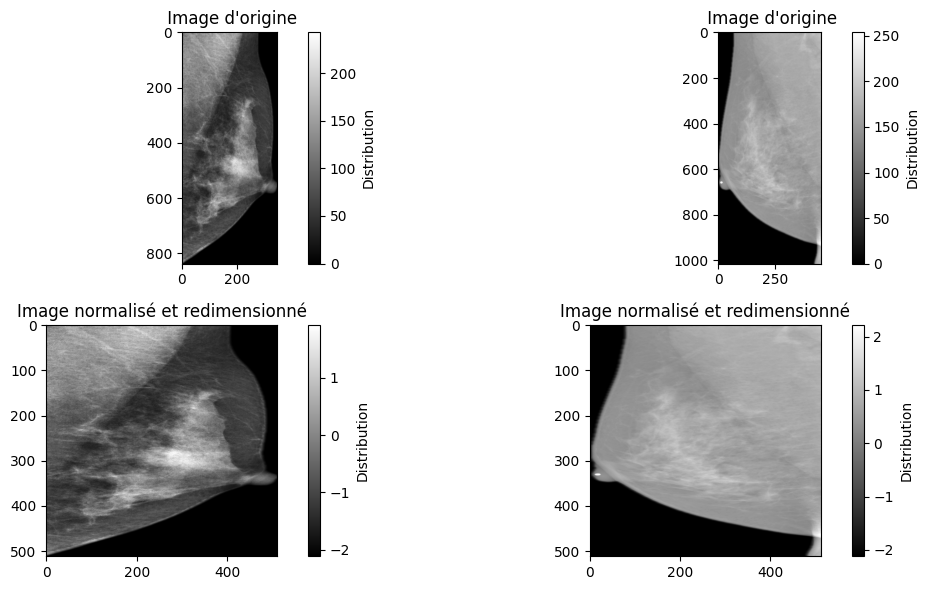

In [ ]:
import matplotlib.pyplot as plt

# ...

fig, axes = plt.subplots(2, 2, figsize=(12, 6))

for i in range(2):
    row = i // 4  # Calculate the row index
    col = i % 4   # Calculate the column index

    image, label, image_source = train_dataset[i]

    # Plot original image
    im_scr =  axes[row, col].imshow(image_source, cmap='gray')
    axes[row, col].set_title(' Image d\'origine')
    axes[row, col].axis('on')

    # Plot transformed image
    im = axes[row+1, col].imshow(image[0], cmap='gray')
    axes[row+1, col].set_title('Image normalisé et redimensionné')
    axes[row+1, col].axis('on')

    # Add colorbar
    cbar_1 = fig.colorbar(im_scr, ax=axes[row, col])
    cbar_1.set_label('Distribution')
    cbar = fig.colorbar(im, ax=axes[row+1, col])
    cbar.set_label('Distribution')

plt.tight_layout()
plt.show()


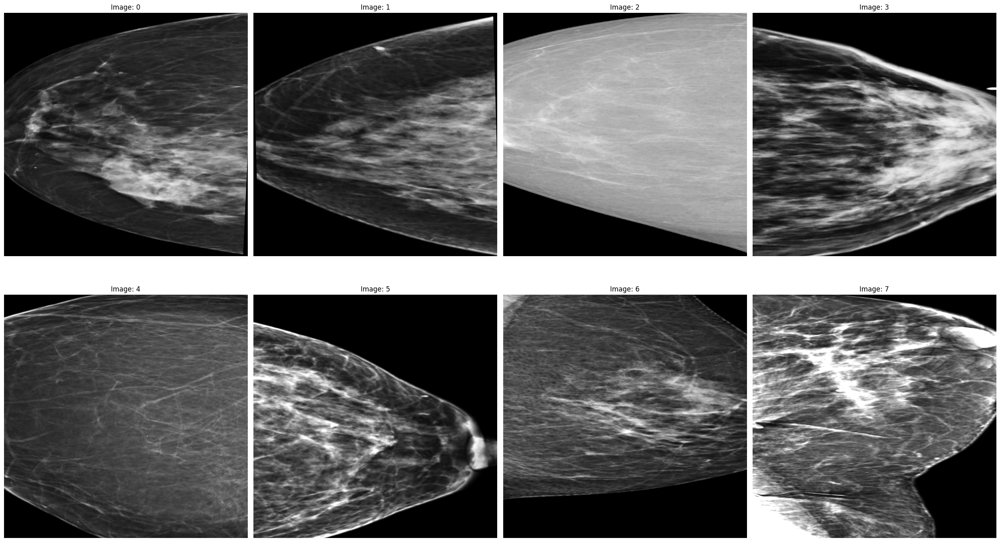

In [ ]:
def get_transforms(*, data):

    if data == 'train':
        return A.Compose([
                A.Resize(CFG.size, CFG.size),
                # crop, tweak from A.RandomSizedCrop()
                A.RandomResizedCrop(height=CFG.size, width=CFG.size, scale=(0.5, 1.0), ratio=(0.5, 0.8)),
                # flip
                A.HorizontalFlip(p=0.5),
                A.VerticalFlip(p=0.5),
                    # downscale
                A.OneOf([
                    A.Downscale(scale_min=0.75, scale_max=0.95, interpolation=cv2.INTER_LINEAR, p=0.1),
                    A.Downscale(scale_min=0.75, scale_max=0.95, interpolation=cv2.INTER_LANCZOS4, p=0.1),
                    A.Downscale(scale_min=0.75, scale_max=0.95, interpolation=cv2.INTER_LINEAR, p=0.1),
                ], p=0.125),
                  # contrast
                A.OneOf([
                    A.RandomToneCurve(scale=0.3, p=0.1),
                    A.RandomBrightnessContrast(brightness_limit=(-0.1, 0.2), contrast_limit=(-0.4, 0.5), brightness_by_max=True, always_apply=False, p=0.5)
                ], p=0.5),
                    # geometric
                A.OneOf([
                    A.ShiftScaleRotate(shift_limit=None, scale_limit=[-0.15, 0.15], rotate_limit=[-30, 30],
                                      interpolation=cv2.INTER_LINEAR, border_mode=cv2.BORDER_CONSTANT, value=0,
                                      mask_value=None, shift_limit_x=[-0.1, 0.1], shift_limit_y=[-0.2, 0.2],
                                      rotate_method='largest_box', p=0.1),
                    A.ElasticTransform(alpha=1, sigma=20, alpha_affine=10, interpolation=cv2.INTER_LINEAR,
                                      border_mode=cv2.BORDER_CONSTANT, value=0, mask_value=None, approximate=False,
                                      same_dxdy=False, p=0.1),
                    A.GridDistortion(num_steps=5, distort_limit=0.3, interpolation=cv2.INTER_LINEAR,
                                    border_mode=cv2.BORDER_CONSTANT, value=0, mask_value=None, p=0.1),
                ], p=0.5),

                #A.Blur(p=0.5),
                #A.CLAHE(p=0.8),
                #A.HueSaturationValue(p=0.5),
                #A.RandomBrightnessContrast(p=0.5),
                #A.Sharpen(p=0.8),
                #A.GaussianBlur(p=0.2),
                #A.MedianBlur(p=0.2),


                # random erase
                A.CoarseDropout(max_holes=6, max_height=0.10, max_width=0.15, min_holes=1, min_height=0.05, min_width=0.1,
                                fill_value=0, mask_fill_value=None, p=0.15),

                #A.RandomResizedCrop(CFG.size, CFG.size, scale=(0.9, 1.0)),
                #A.HorizontalFlip(p=0.5),
              A.Normalize(
                      mean=[0.485, 0.456, 0.406],
                      std=[0.229, 0.224, 0.225],
              ),
                ToTensorV2(),
            ])

    elif data == 'valid':
        return A.Compose([
            A.Resize(CFG.size, CFG.size),
            A.Normalize(
                    mean=[0.485, 0.456, 0.406],
                    std=[0.229, 0.224, 0.225],
            ),
            ToTensorV2(),
        ])




train_dataset = TrainDataset(train, transform=get_transforms(data='train'))


fig, axes = plt.subplots(2, 4, figsize=(25, 15))

for i in range(8):
    row = i // 4  # Calculate the row index
    col = i % 4   # Calculate the column index
    image, label = train_dataset[i]
    axes[row, col].imshow(image[0], cmap='gray')
    axes[row, col].set_title(f'Image: {i}')
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()


## MODEL

In [ ]:

class SelfAttention(nn.Module):
    def __init__(self, in_dim, activation):
        super(SelfAttention, self).__init__()
        self.query = nn.Conv2d(in_dim, in_dim // 8, kernel_size=1)
        self.key = nn.Conv2d(in_dim, in_dim // 8, kernel_size=1)
        self.value = nn.Conv2d(in_dim, in_dim, kernel_size=1)
        self.activation = activation

    def forward(self, x):
        batch_size, channels, height, width = x.size()

        query = self.query(x).view(batch_size, -1, height * width).permute(0, 2, 1)
        key = self.key(x).view(batch_size, -1, height * width)
        energy = torch.bmm(query, key)
        attention = self.activation(energy)
        value = self.value(x).view(batch_size, -1, height * width)

        out = torch.bmm(value, attention.permute(0, 2, 1))
        out = out.view(batch_size, channels, height, width)

        return out

class CustomModel(nn.Module):
    def __init__(self, model_name='tf_efficientnetv2_s.in21k_ft_in1k', pretrained=False):
        super().__init__()
        self.model = timm.create_model(model_name, pretrained=pretrained)
        n_features = self.model.classifier.in_features

        self.self_attention = SelfAttention(n_features, activation=nn.Softmax(dim=-1))

        self.model.classifier = nn.Sequential(
            nn.Linear(n_features, CFG.target_size),
            nn.Sigmoid()  # Apply sigmoid activation for binary classification
        )

    def forward(self, x):
        x = self.model(x)
        x = self.self_attention(x)
        return x


In [ ]:
class CustomModel(nn.Module):
    def __init__(self, model_name='tf_efficientnetv2_s.in21k_ft_in1k', pretrained=False):
        super().__init__()
        self.model = timm.create_model(model_name, pretrained=pretrained)
        n_features = self.model.classifier.in_features
        self.model.classifier = nn.Sequential(
            nn.Linear(n_features, CFG.target_size),
            nn.Sigmoid()  # Apply sigmoid activation for binary classification
        )

    def forward(self, x):
        x = self.model(x)
        return x


In [ ]:
class CustomModel(nn.Module):
    def __init__(self, model_name='convnetv2_small', pretrained=False):
        super().__init__()
        self.model = timm.create_model(model_name, pretrained=pretrained)
        n_features = self.model.fc.in_features
        self.model.fc = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),  # Apply adaptive average pooling
            nn.Flatten(),  # Flatten the feature maps
            nn.Linear(n_features, CFG.target_size),
            nn.Sigmoid()  # Apply sigmoid activation for binary classification
        )

    def forward(self, x):
        x = self.model(x)
        return x


In [ ]:
class CustomModel(nn.Module):
    def __init__(self, model_name='swin_base_patch4_window12_384', pretrained=False):
        super().__init__()
        self.model = timm.create_model(model_name, pretrained=pretrained)
        n_features = self.model.head.in_features
        self.model.head = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),  # Apply adaptive average pooling
            nn.Flatten(),  # Flatten the feature maps
            nn.Linear(n_features, CFG.target_size),
            nn.Sigmoid()  # Apply sigmoid activation for binary classification
        )

    def forward(self, x):
        x = self.model(x)
        return x


## Helper functions

In [ ]:
# ====================================================
# Helper functions
# ====================================================
class AverageMeter(object):
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count


def asMinutes(s):
    m = math.floor(s / 60)
    s -= m * 60
    return '%dm %ds' % (m, s)


def timeSince(since, percent):
    now = time.time()
    s = now - since
    es = s / (percent)
    rs = es - s
    return '%s (remain %s)' % (asMinutes(s), asMinutes(rs))


def train_fn(train_loader, model, criterion, optimizer, epoch, scheduler, device):
    scaler = GradScaler()
    batch_time = AverageMeter()
    data_time = AverageMeter()
    losses = AverageMeter()
    scores = AverageMeter()
    # switch to train mode
    model.train()
    start = end = time.time()
    global_step = 0
    #print( train_loader)
    for step, (images, labels) in enumerate(train_loader):
        # measure data loading time
        #print( images)
        #print(labels,images)
        data_time.update(time.time() - end)
        images = images.to(device)
        labels = labels.to(device)
        batch_size = labels.size(0)

        y_preds = model(images)
        loss = criterion(y_preds, labels)
        # record loss
        losses.update(loss.item(), batch_size)
        if CFG.gradient_accumulation_steps > 1:
            loss = loss / CFG.gradient_accumulation_steps
        scaler.scale(loss).backward()
        grad_norm = torch.nn.utils.clip_grad_norm_(model.parameters(), CFG.max_grad_norm)
        if (step + 1) % CFG.gradient_accumulation_steps == 0:
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()
            global_step += 1
        # measure elapsed time
        batch_time.update(time.time() - end)
        end = time.time()
        if step % CFG.print_freq == 0 or step == (len(train_loader)-1):
            print('Epoch: [{0}][{1}/{2}] '
                  'Data {data_time.val:.3f} ({data_time.avg:.3f}) '
                  'Elapsed {remain:s} '
                  'Loss: {loss.val:.4f}({loss.avg:.4f}) '
                  'Grad: {grad_norm:.4f}  '
                  #'LR: {lr:.6f}  '
                  .format(
                   epoch+1, step, len(train_loader), batch_time=batch_time,
                   data_time=data_time, loss=losses,
                   remain=timeSince(start, float(step+1)/len(train_loader)),
                   grad_norm=grad_norm,
                   #lr=scheduler.get_lr()[0],
                   ))
    return losses.avg


def valid_fn(valid_loader, model, criterion, device):
    batch_time = AverageMeter()
    data_time = AverageMeter()
    losses = AverageMeter()
    scores = AverageMeter()
    # switch to evaluation mode
    model.eval()
    preds = []
    start = end = time.time()
    for step, (images, labels) in enumerate(valid_loader):
        # measure data loading time
        #print(labels)
        data_time.update(time.time() - end)
        images = images.to(device)
        labels = labels.to(device)
        batch_size = labels.size(0)
        # compute loss

        y_preds = model(images)

        loss = criterion(y_preds, labels)
        losses.update(loss.item(), batch_size)
        # record accuracy
        #preds.append(y_preds.sigmoid().to('cpu').numpy())
        preds.append(y_preds.to('cpu').detach().numpy())
        if CFG.gradient_accumulation_steps > 1:
            loss = loss / CFG.gradient_accumulation_steps
        # measure elapsed time
        batch_time.update(time.time() - end)
        end = time.time()
        if step % CFG.print_freq == 0 or step == (len(valid_loader)-1):
            print('EVAL: [{0}/{1}] '
                  'Data {data_time.val:.3f} ({data_time.avg:.3f}) '
                  'Elapsed {remain:s} '
                  'Loss: {loss.val:.4f}({loss.avg:.4f}) '
                  .format(
                   step, len(valid_loader), batch_time=batch_time,
                   data_time=data_time, loss=losses,
                   remain=timeSince(start, float(step+1)/len(valid_loader)),
                   ))
    predictions = np.concatenate(preds)
    return losses.avg, predictions


## Train loop


In [ ]:

def train_loop(folds, fold, pat=3):

    LOGGER.info(f"========== fold: {fold} training ==========")

    # ====================================================
    # loader
    # ====================================================
    #print(folds)
    trn_idx = folds[folds['fold'] != fold].index
    val_idx = folds[folds['fold'] == fold].index
    #print(val_idx)

    train_folds = folds.loc[trn_idx].reset_index(drop=True)
    #print(train_folds)
    valid_folds = folds.loc[val_idx].reset_index(drop=True)
    #print(valid_folds)
    valid_labels = valid_folds[CFG.target_cols].values
    #print(valid_labels)



    train_dataset = TrainDataset(train_folds,
                                 transform=get_transforms(data='train'))


    valid_dataset = TrainDataset(valid_folds,
                                 transform=get_transforms(data='valid'))

    train_loader = DataLoader(train_dataset,
                              batch_size=CFG.batch_size,
                              shuffle=False,
                              num_workers=CFG.num_workers, pin_memory=True, drop_last=True)

    valid_loader = DataLoader(valid_dataset,
                              batch_size=CFG.batch_size,
                              shuffle=False,
                              num_workers=CFG.num_workers, pin_memory=True, drop_last=False)

    # ====================================================
    # scheduler
    # ====================================================
    def get_scheduler(optimizer):
        if CFG.scheduler=='ReduceLROnPlateau':
            scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=CFG.factor, patience=CFG.patience, verbose=True, eps=CFG.eps)
        elif CFG.scheduler=='CosineAnnealingLR':
            scheduler = CosineAnnealingLR(optimizer, T_max=CFG.T_max, eta_min=CFG.min_lr, last_epoch=-1)
        elif CFG.scheduler=='CosineAnnealingWarmRestarts':
            scheduler = CosineAnnealingWarmRestarts(optimizer, T_0=CFG.T_0, T_mult=1, eta_min=CFG.min_lr, last_epoch=-1)
        return scheduler

    # ====================================================
    # model & optimizer
    # ====================================================
    model = CustomModel(CFG.model_name, pretrained=True)
    model.to(device)

    ## replace AdamW with Adafactor




    #optimizer = torch.optim.NAdam(model.parameters(), lr=CFG.lr, weight_decay=CFG.weight_decay)
    #optimizer = Adam(model.parameters(), lr=CFG.lr, weight_decay=CFG.weight_decay, amsgrad=False)
    #optimizer = torch.optim.RAdam(model.parameters(), lr=CFG.lr, weight_decay=CFG.weight_decay)

    optimizer = torch.optim.AdamW(model.parameters(), lr=CFG.lr, weight_decay=CFG.weight_decay)
    #optimizer = torch.optim.SGD(model.parameters(), lr=CFG.lr, weight_decay=CFG.weight_decay, momentum=0.9)

    scheduler = get_scheduler(optimizer)

    # ====================================================
    # loop
    # ====================================================
    #criterion = RMSELoss()
    criterion = nn.BCEWithLogitsLoss()
    # Initialize variables for early stopping
    best_loss = np.inf
    early_stopping_counter = 0

    for epoch in range(CFG.epochs):

        start_time = time.time()

        # Train
        avg_loss = train_fn(train_loader, model, criterion, optimizer, epoch, scheduler, device)
        #print('train_loader')
        # Evaluate
        avg_val_loss, preds = valid_fn(valid_loader, model, criterion, device)

        # Adjust learning rate scheduler
        if isinstance(scheduler, ReduceLROnPlateau):
            scheduler.step(avg_val_loss)
        elif isinstance(scheduler, CosineAnnealingLR):
            scheduler.step()
        elif isinstance(scheduler, CosineAnnealingWarmRestarts):
            scheduler.step()

        # Scoring
        score, scores = get_score(valid_labels, preds)

        elapsed = time.time() - start_time

        LOGGER.info(f'Epoch {epoch+1} - avg_train_loss: {avg_loss:.4f}  avg_val_loss: {avg_val_loss:.4f}  time: {elapsed:.0f}s')
        LOGGER.info(f'Epoch {epoch+1} - Score: {score:.4f}  Scores: {np.round(scores, decimals=4)}')

        # Save model if validation loss improves
        if avg_val_loss < best_loss:
            best_loss = avg_val_loss
            early_stopping_counter = 0
            LOGGER.info(f'Epoch {epoch+1} - Save Best Loss: {best_loss:.4f} Model')
            torch.save({'model': model.state_dict(),
                        'preds': preds},
                        OUTPUT_DIR+f'{CFG.model_name}_fold_v1_{fold}_best.pth')
        else:
            # Increment early stopping counter
            early_stopping_counter += 1
            # Check if early stopping criteria met
            if early_stopping_counter >= pat:
                LOGGER.info(f'Early stopping triggered. No improvement in {pat} epochs.')
                break

    check_point = torch.load(OUTPUT_DIR+f'{CFG.model_name}_fold_v1_{fold}_best.pth')
    for c in [f'pred_{c}' for c in CFG.target_cols]:
        valid_folds[c] = np.nan
    valid_folds[[f'pred_{c}' for c in CFG.target_cols]] = check_point['preds']

    return valid_folds


In [ ]:
# ====================================================
# main
# ====================================================
def main():

    """
    Prepare: 1.train  2.folds
    """

    def get_result(result_df):
        preds = result_df[[f'pred_{c}' for c in CFG.target_cols]].values
        labels = result_df[CFG.target_cols].values
        score, scores = get_score(labels, preds)
        LOGGER.info(f'Score: {score:<.4f}  Scores: {np.round(scores, decimals=4)}')

    if CFG.train:
        # train
        oof_df = pd.DataFrame()
        i = 0
        for fold in range(CFG.n_fold):
            if fold in CFG.trn_fold:
                #print(folds)

                _oof_df = train_loop(folds, fold)
                #print(_oof_df)
                oof_df = pd.concat([oof_df, _oof_df])
                LOGGER.info(f"========== fold: {fold} result ==========")
                get_result(_oof_df)
            i = i + 1
            oof_df.to_csv(OUTPUT_DIR+'oof_df'+str(i)+'.csv', index=False)

        # CV result
        LOGGER.info(f"========== CV ==========")
        get_result(oof_df)
        # save result
        oof_df.to_csv(OUTPUT_DIR+'v1_oof_df.csv', index=False)

if __name__ == '__main__':
    main()

========== fold: 0 training ==========
INFO:__main__:========== fold: 0 training ==========


Epoch: [1][0/1562] Data 7.530 (7.530) Elapsed 0m 16s (remain 442m 3s) Loss: 0.9269(0.9269) Grad: 142410.8281  
Epoch: [1][100/1562] Data 4.031 (3.704) Elapsed 6m 41s (remain 96m 40s) Loss: 0.6619(0.6987) Grad: 881.1688  
Epoch: [1][200/1562] Data 0.556 (14.752) Elapsed 50m 8s (remain 339m 32s) Loss: 0.6736(0.6808) Grad: 332010.5625  
Epoch: [1][300/1562] Data 0.041 (9.921) Elapsed 50m 46s (remain 212m 42s) Loss: 0.6659(0.6726) Grad: 78786.2422  
Epoch: [1][400/1562] Data 0.000 (7.503) Elapsed 51m 25s (remain 148m 52s) Loss: 0.6298(0.6680) Grad: 25.9321  
Epoch: [1][500/1562] Data 0.000 (6.046) Elapsed 52m 2s (remain 110m 12s) Loss: 0.7132(0.6648) Grad: 3.3199  
Epoch: [1][600/1562] Data 0.000 (5.076) Elapsed 52m 40s (remain 84m 13s) Loss: 0.7132(0.6638) Grad: 2.5938  
Epoch: [1][700/1562] Data 0.010 (4.383) Elapsed 53m 18s (remain 65m 28s) Loss: 0.6615(0.6635) Grad: 7.1484  
Epoch: [1][800/1562] Data 0.352 (3.862) Elapsed 53m 55s (remain 51m 14s) Loss: 0.6298(0.6635) Grad: 1.5958  
Epo

Epoch 1 - avg_train_loss: 0.6603  avg_val_loss: 0.6459  time: 3610s
INFO:__main__:Epoch 1 - avg_train_loss: 0.6603  avg_val_loss: 0.6459  time: 3610s
Epoch 1 - Score: 0.8794  Scores: [0.8794]
INFO:__main__:Epoch 1 - Score: 0.8794  Scores: [0.8794]
Epoch 1 - Save Best Loss: 0.6459 Model
INFO:__main__:Epoch 1 - Save Best Loss: 0.6459 Model


EVAL: [520/521] Data 0.000 (0.129) Elapsed 1m 32s (remain 0m 0s) Loss: 0.6172(0.6459) 
Epoch: [2][0/1562] Data 1.035 (1.035) Elapsed 0m 1s (remain 31m 54s) Loss: 0.6615(0.6615) Grad: 1.4488  
Epoch: [2][100/1562] Data 0.432 (0.183) Elapsed 0m 35s (remain 8m 29s) Loss: 0.6975(0.6668) Grad: 277832.4375  
Epoch: [2][200/1562] Data 0.242 (0.189) Elapsed 1m 11s (remain 8m 1s) Loss: 0.7130(0.6595) Grad: 3732.3074  
Epoch: [2][300/1562] Data 0.378 (0.197) Elapsed 1m 48s (remain 7m 36s) Loss: 0.6615(0.6574) Grad: 19.0359  
Epoch: [2][400/1562] Data 0.294 (0.202) Elapsed 2m 27s (remain 7m 6s) Loss: 0.6298(0.6537) Grad: 0.6051  
Epoch: [2][500/1562] Data 0.000 (0.199) Elapsed 3m 2s (remain 6m 25s) Loss: 0.6615(0.6532) Grad: 1.2257  
Epoch: [2][600/1562] Data 0.222 (0.199) Elapsed 3m 39s (remain 5m 50s) Loss: 0.7132(0.6537) Grad: 0.9244  
Epoch: [2][700/1562] Data 0.000 (0.200) Elapsed 4m 16s (remain 5m 14s) Loss: 0.6615(0.6539) Grad: 69.1895  
Epoch: [2][800/1562] Data 0.022 (0.202) Elapsed 4m 5

Epoch 2 - avg_train_loss: 0.6527  avg_val_loss: 0.6704  time: 663s
INFO:__main__:Epoch 2 - avg_train_loss: 0.6527  avg_val_loss: 0.6704  time: 663s
Epoch 2 - Score: 0.8632  Scores: [0.8632]
INFO:__main__:Epoch 2 - Score: 0.8632  Scores: [0.8632]


EVAL: [520/521] Data 0.165 (0.120) Elapsed 1m 27s (remain 0m 0s) Loss: 0.7240(0.6704) 
Epoch: [3][0/1562] Data 0.713 (0.713) Elapsed 0m 0s (remain 23m 15s) Loss: 0.6615(0.6615) Grad: 0.6354  
Epoch: [3][100/1562] Data 0.000 (0.201) Elapsed 0m 37s (remain 8m 56s) Loss: 0.6615(0.6594) Grad: 1.0398  
Epoch: [3][200/1562] Data 0.611 (0.195) Elapsed 1m 12s (remain 8m 11s) Loss: 0.6615(0.6563) Grad: 0.7533  
Epoch: [3][300/1562] Data 0.604 (0.194) Elapsed 1m 48s (remain 7m 33s) Loss: 0.6615(0.6544) Grad: 0.3577  
Epoch: [3][400/1562] Data 0.186 (0.194) Elapsed 2m 24s (remain 6m 57s) Loss: 0.6298(0.6510) Grad: 0.4629  
Epoch: [3][500/1562] Data 0.420 (0.199) Elapsed 3m 2s (remain 6m 26s) Loss: 0.6615(0.6506) Grad: 0.2907  
Epoch: [3][600/1562] Data 0.000 (0.199) Elapsed 3m 39s (remain 5m 50s) Loss: 0.7132(0.6516) Grad: 0.0844  
Epoch: [3][700/1562] Data 0.000 (0.201) Elapsed 4m 16s (remain 5m 15s) Loss: 0.6615(0.6520) Grad: 0.6285  
Epoch: [3][800/1562] Data 0.366 (0.201) Elapsed 4m 53s (rema

Epoch 3 - avg_train_loss: 0.6499  avg_val_loss: 0.6435  time: 656s
INFO:__main__:Epoch 3 - avg_train_loss: 0.6499  avg_val_loss: 0.6435  time: 656s
Epoch 3 - Score: 0.8723  Scores: [0.8723]
INFO:__main__:Epoch 3 - Score: 0.8723  Scores: [0.8723]
Epoch 3 - Save Best Loss: 0.6435 Model
INFO:__main__:Epoch 3 - Save Best Loss: 0.6435 Model


EVAL: [520/521] Data 0.165 (0.119) Elapsed 1m 26s (remain 0m 0s) Loss: 0.6172(0.6435) 
Epoch: [4][0/1562] Data 0.860 (0.860) Elapsed 0m 1s (remain 26m 50s) Loss: 0.6615(0.6615) Grad: 0.9201  
Epoch: [4][100/1562] Data 0.714 (0.214) Elapsed 0m 38s (remain 9m 15s) Loss: 0.7132(0.6551) Grad: 0.2792  
Epoch: [4][200/1562] Data 0.231 (0.213) Elapsed 1m 16s (remain 8m 35s) Loss: 0.6628(0.6508) Grad: 60872.3242  
Epoch: [4][300/1562] Data 0.290 (0.205) Elapsed 1m 51s (remain 7m 46s) Loss: 0.6615(0.6493) Grad: 0.1614  
Epoch: [4][400/1562] Data 0.520 (0.202) Elapsed 2m 27s (remain 7m 6s) Loss: 0.6298(0.6472) Grad: 0.0407  
Epoch: [4][500/1562] Data 0.000 (0.205) Elapsed 3m 5s (remain 6m 33s) Loss: 0.6615(0.6468) Grad: 52.2887  
Epoch: [4][600/1562] Data 0.000 (0.205) Elapsed 3m 42s (remain 5m 55s) Loss: 0.7132(0.6476) Grad: 1152.3495  
Epoch: [4][700/1562] Data 0.762 (0.204) Elapsed 4m 18s (remain 5m 18s) Loss: 0.6615(0.6484) Grad: 0.0537  
Epoch: [4][800/1562] Data 0.281 (0.202) Elapsed 4m 54

Epoch 4 - avg_train_loss: 0.6486  avg_val_loss: 0.6519  time: 664s
INFO:__main__:Epoch 4 - avg_train_loss: 0.6486  avg_val_loss: 0.6519  time: 664s
Epoch 4 - Score: 0.8812  Scores: [0.8812]
INFO:__main__:Epoch 4 - Score: 0.8812  Scores: [0.8812]


EVAL: [520/521] Data 0.000 (0.119) Elapsed 1m 27s (remain 0m 0s) Loss: 0.6172(0.6519) 
Epoch: [5][0/1562] Data 0.713 (0.713) Elapsed 0m 0s (remain 23m 31s) Loss: 0.6615(0.6615) Grad: 0.0849  
Epoch: [5][100/1562] Data 0.000 (0.203) Elapsed 0m 37s (remain 8m 58s) Loss: 0.6615(0.6562) Grad: 0.2315  
Epoch: [5][200/1562] Data 0.000 (0.204) Elapsed 1m 14s (remain 8m 22s) Loss: 0.6615(0.6503) Grad: 0.1336  
Epoch: [5][300/1562] Data 0.410 (0.202) Elapsed 1m 50s (remain 7m 42s) Loss: 0.6615(0.6486) Grad: 0.0345  
Epoch: [5][400/1562] Data 0.000 (0.206) Elapsed 2m 28s (remain 7m 10s) Loss: 0.6298(0.6467) Grad: 0.0079  
Epoch: [5][500/1562] Data 0.355 (0.209) Elapsed 3m 7s (remain 6m 36s) Loss: 0.6615(0.6460) Grad: 0.0131  
Epoch: [5][600/1562] Data 0.011 (0.207) Elapsed 3m 44s (remain 5m 58s) Loss: 0.7132(0.6470) Grad: 0.0028  
Epoch: [5][700/1562] Data 0.560 (0.208) Elapsed 4m 21s (remain 5m 21s) Loss: 0.6615(0.6477) Grad: 0.0356  
Epoch: [5][800/1562] Data 0.218 (0.207) Elapsed 4m 57s (rema

Epoch 5 - avg_train_loss: 0.6472  avg_val_loss: 0.6478  time: 663s
INFO:__main__:Epoch 5 - avg_train_loss: 0.6472  avg_val_loss: 0.6478  time: 663s
Epoch 5 - Score: 0.8761  Scores: [0.8761]
INFO:__main__:Epoch 5 - Score: 0.8761  Scores: [0.8761]


EVAL: [520/521] Data 0.000 (0.120) Elapsed 1m 27s (remain 0m 0s) Loss: 0.6172(0.6478) 


========== fold: 0 result ==========
INFO:__main__:========== fold: 0 result ==========
Score: 0.8723  Scores: [0.8723]
INFO:__main__:Score: 0.8723  Scores: [0.8723]
========== fold: 1 training ==========
INFO:__main__:========== fold: 1 training ==========


Epoch: [1][0/1562] Data 0.704 (0.704) Elapsed 0m 0s (remain 23m 42s) Loss: 0.9478(0.9478) Grad: 153234.5938  
Epoch: [1][100/1562] Data 0.000 (0.216) Elapsed 0m 38s (remain 9m 17s) Loss: 0.6723(0.6901) Grad: 50748.4219  
Epoch: [1][200/1562] Data 0.207 (0.210) Elapsed 1m 15s (remain 8m 31s) Loss: 0.6310(0.6781) Grad: 15009.9268  
Epoch: [1][300/1562] Data 0.572 (0.212) Elapsed 1m 53s (remain 7m 56s) Loss: 0.7132(0.6707) Grad: 14.8850  
Epoch: [1][400/1562] Data 0.000 (0.206) Elapsed 2m 28s (remain 7m 11s) Loss: 0.5667(0.6667) Grad: 2704.2935  
Epoch: [1][500/1562] Data 0.216 (0.202) Elapsed 3m 4s (remain 6m 30s) Loss: 0.6300(0.6653) Grad: 2255.9016  
Epoch: [1][600/1562] Data 0.000 (0.200) Elapsed 3m 39s (remain 5m 51s) Loss: 0.7132(0.6646) Grad: 36.4990  
Epoch: [1][700/1562] Data 0.003 (0.200) Elapsed 4m 16s (remain 5m 14s) Loss: 0.5982(0.6638) Grad: 3.4157  
Epoch: [1][800/1562] Data 0.592 (0.200) Elapsed 4m 52s (remain 4m 38s) Loss: 0.6615(0.6636) Grad: 7.2994  
Epoch: [1][900/1562

Epoch 1 - avg_train_loss: 0.6589  avg_val_loss: 0.6824  time: 659s
INFO:__main__:Epoch 1 - avg_train_loss: 0.6589  avg_val_loss: 0.6824  time: 659s
Epoch 1 - Score: 0.8687  Scores: [0.8687]
INFO:__main__:Epoch 1 - Score: 0.8687  Scores: [0.8687]
Epoch 1 - Save Best Loss: 0.6824 Model
INFO:__main__:Epoch 1 - Save Best Loss: 0.6824 Model


EVAL: [520/521] Data 0.000 (0.122) Elapsed 1m 28s (remain 0m 0s) Loss: 0.8412(0.6824) 
Epoch: [2][0/1562] Data 1.000 (1.000) Elapsed 0m 1s (remain 30m 22s) Loss: 0.7449(0.7449) Grad: 456.2640  
Epoch: [2][100/1562] Data 0.242 (0.200) Elapsed 0m 36s (remain 8m 53s) Loss: 0.6615(0.6537) Grad: 1.3661  
Epoch: [2][200/1562] Data 0.000 (0.199) Elapsed 1m 13s (remain 8m 15s) Loss: 0.6298(0.6608) Grad: 0.3005  
Epoch: [2][300/1562] Data 0.258 (0.199) Elapsed 1m 49s (remain 7m 39s) Loss: 0.7133(0.6568) Grad: 7362.9390  
Epoch: [2][400/1562] Data 0.568 (0.204) Elapsed 2m 28s (remain 7m 8s) Loss: 0.5349(0.6550) Grad: 136.9993  
Epoch: [2][500/1562] Data 0.000 (0.204) Elapsed 3m 5s (remain 6m 31s) Loss: 0.6298(0.6546) Grad: 26.8309  
Epoch: [2][600/1562] Data 0.616 (0.205) Elapsed 3m 42s (remain 5m 56s) Loss: 0.6298(0.6548) Grad: 0.4543  
Epoch: [2][700/1562] Data 0.000 (0.203) Elapsed 4m 18s (remain 5m 17s) Loss: 0.5672(0.6557) Grad: 8522.1553  
Epoch: [2][800/1562] Data 0.004 (0.204) Elapsed 4m

Epoch 2 - avg_train_loss: 0.6536  avg_val_loss: 0.6540  time: 664s
INFO:__main__:Epoch 2 - avg_train_loss: 0.6536  avg_val_loss: 0.6540  time: 664s
Epoch 2 - Score: 0.8850  Scores: [0.885]
INFO:__main__:Epoch 2 - Score: 0.8850  Scores: [0.885]
Epoch 2 - Save Best Loss: 0.6540 Model
INFO:__main__:Epoch 2 - Save Best Loss: 0.6540 Model


EVAL: [520/521] Data 0.000 (0.119) Elapsed 1m 27s (remain 0m 0s) Loss: 0.6552(0.6540) 
Epoch: [3][0/1562] Data 0.894 (0.894) Elapsed 0m 1s (remain 27m 41s) Loss: 0.7449(0.7449) Grad: 1363.7723  
Epoch: [3][100/1562] Data 0.000 (0.231) Elapsed 0m 40s (remain 9m 39s) Loss: 0.6615(0.6528) Grad: 0.3306  
Epoch: [3][200/1562] Data 0.534 (0.224) Elapsed 1m 18s (remain 8m 50s) Loss: 0.6298(0.6540) Grad: 0.1495  
Epoch: [3][300/1562] Data 0.005 (0.209) Elapsed 1m 52s (remain 7m 52s) Loss: 0.7132(0.6516) Grad: 0.0831  
Epoch: [3][400/1562] Data 0.581 (0.209) Elapsed 2m 29s (remain 7m 14s) Loss: 0.5982(0.6512) Grad: 354.2800  
Epoch: [3][500/1562] Data 0.053 (0.206) Elapsed 3m 6s (remain 6m 34s) Loss: 0.6298(0.6504) Grad: 1.8071  
Epoch: [3][600/1562] Data 0.000 (0.204) Elapsed 3m 42s (remain 5m 55s) Loss: 0.6298(0.6520) Grad: 0.0463  
Epoch: [3][700/1562] Data 0.224 (0.207) Elapsed 4m 21s (remain 5m 20s) Loss: 0.6812(0.6528) Grad: 8069.7964  
Epoch: [3][800/1562] Data 0.012 (0.209) Elapsed 4m 5

Epoch 3 - avg_train_loss: 0.6515  avg_val_loss: 0.6701  time: 666s
INFO:__main__:Epoch 3 - avg_train_loss: 0.6515  avg_val_loss: 0.6701  time: 666s
Epoch 3 - Score: 0.8702  Scores: [0.8702]
INFO:__main__:Epoch 3 - Score: 0.8702  Scores: [0.8702]


EVAL: [520/521] Data 0.000 (0.120) Elapsed 1m 27s (remain 0m 0s) Loss: 0.6552(0.6701) 
Epoch: [4][0/1562] Data 1.032 (1.032) Elapsed 0m 1s (remain 31m 23s) Loss: 0.7448(0.7448) Grad: 42.8889  
Epoch: [4][100/1562] Data 0.387 (0.211) Elapsed 0m 38s (remain 9m 12s) Loss: 0.6615(0.6509) Grad: 0.1982  
Epoch: [4][200/1562] Data 0.275 (0.215) Elapsed 1m 16s (remain 8m 39s) Loss: 0.6298(0.6531) Grad: 0.0169  
Epoch: [4][300/1562] Data 0.680 (0.207) Elapsed 1m 52s (remain 7m 49s) Loss: 0.6615(0.6515) Grad: 0.2957  
Epoch: [4][400/1562] Data 0.236 (0.212) Elapsed 2m 31s (remain 7m 18s) Loss: 0.5665(0.6504) Grad: 1.1373  
Epoch: [4][500/1562] Data 0.000 (0.213) Elapsed 3m 9s (remain 6m 41s) Loss: 0.6298(0.6499) Grad: 0.0304  
Epoch: [4][600/1562] Data 0.547 (0.212) Elapsed 3m 46s (remain 6m 2s) Loss: 0.6298(0.6501) Grad: 0.0331  
Epoch: [4][700/1562] Data 0.000 (0.212) Elapsed 4m 24s (remain 5m 24s) Loss: 0.6298(0.6507) Grad: 2707.2378  
Epoch: [4][800/1562] Data 0.709 (0.209) Elapsed 5m 0s (re

Epoch 4 - avg_train_loss: 0.6494  avg_val_loss: 0.6463  time: 671s
INFO:__main__:Epoch 4 - avg_train_loss: 0.6494  avg_val_loss: 0.6463  time: 671s
Epoch 4 - Score: 0.8921  Scores: [0.8921]
INFO:__main__:Epoch 4 - Score: 0.8921  Scores: [0.8921]
Epoch 4 - Save Best Loss: 0.6463 Model
INFO:__main__:Epoch 4 - Save Best Loss: 0.6463 Model


EVAL: [520/521] Data 0.000 (0.118) Elapsed 1m 26s (remain 0m 0s) Loss: 0.6552(0.6463) 
Epoch: [5][0/1562] Data 0.700 (0.700) Elapsed 0m 0s (remain 22m 59s) Loss: 0.6931(0.6931) Grad: 0.9483  
Epoch: [5][100/1562] Data 0.065 (0.229) Elapsed 0m 39s (remain 9m 35s) Loss: 0.6615(0.6483) Grad: 0.0172  
Epoch: [5][200/1562] Data 0.455 (0.212) Elapsed 1m 15s (remain 8m 32s) Loss: 0.6298(0.6495) Grad: 0.0201  
Epoch: [5][300/1562] Data 0.000 (0.199) Elapsed 1m 49s (remain 7m 40s) Loss: 0.7132(0.6476) Grad: 0.2627  
Epoch: [5][400/1562] Data 0.697 (0.203) Elapsed 2m 27s (remain 7m 8s) Loss: 0.5349(0.6466) Grad: 1.2586  
Epoch: [5][500/1562] Data 0.347 (0.207) Elapsed 3m 6s (remain 6m 34s) Loss: 0.6298(0.6460) Grad: 11.0207  
Epoch: [5][600/1562] Data 0.085 (0.207) Elapsed 3m 44s (remain 5m 58s) Loss: 0.6298(0.6471) Grad: 0.0239  
Epoch: [5][700/1562] Data 0.204 (0.207) Elapsed 4m 21s (remain 5m 20s) Loss: 0.5982(0.6477) Grad: 0.1414  
Epoch: [5][800/1562] Data 0.000 (0.207) Elapsed 4m 58s (rema

Epoch 5 - avg_train_loss: 0.6463  avg_val_loss: 0.6491  time: 666s
INFO:__main__:Epoch 5 - avg_train_loss: 0.6463  avg_val_loss: 0.6491  time: 666s
Epoch 5 - Score: 0.8762  Scores: [0.8762]
INFO:__main__:Epoch 5 - Score: 0.8762  Scores: [0.8762]


EVAL: [520/521] Data 0.000 (0.118) Elapsed 1m 26s (remain 0m 0s) Loss: 0.6552(0.6491) 


========== fold: 1 result ==========
INFO:__main__:========== fold: 1 result ==========
Score: 0.8921  Scores: [0.8921]
INFO:__main__:Score: 0.8921  Scores: [0.8921]
========== fold: 2 training ==========
INFO:__main__:========== fold: 2 training ==========


Epoch: [1][0/1562] Data 1.050 (1.050) Elapsed 0m 1s (remain 32m 41s) Loss: 0.9393(0.9393) Grad: 141524.4688  


KeyboardInterrupt: ignored

## Inference

In [ ]:
# ====================================================
# Dataset
# ====================================================
class TestDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.file_names = df['Image_id'].values
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        file_name = self.file_names[idx]
        file_path = f'{TRAIN_PATH}/{file_name}'
        image = cv2.imread(file_path)
        #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        if self.transform:
            augmented = self.transform(image=image)
            image = augmented['image']

        image = torch.tensor(image, dtype=torch.float32)

        return image

test_dataset = TestDataset(test_data[:10], transform=get_transforms(data='valid'))




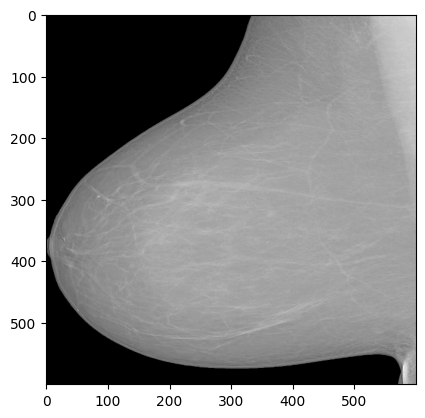

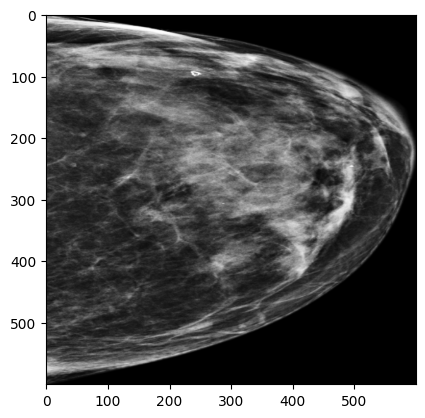

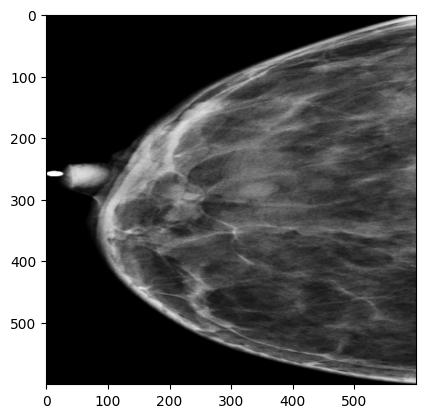

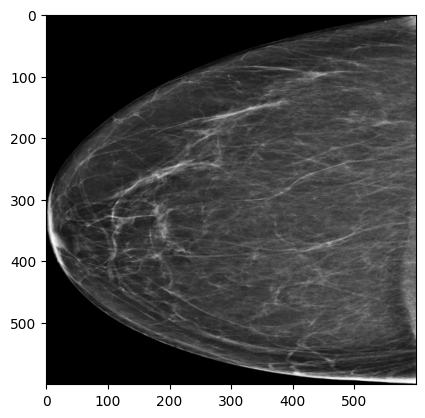

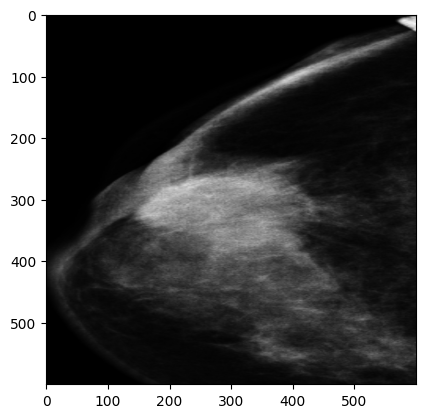

In [ ]:

for i in range(5):
    image = test_dataset[i].clone().detach()
    plt.imshow(image[0],cmap='gray')
    plt.show()
    #plt.imshow(image[0].flip(-1))
    #plt.show()


In [ ]:
image = test_dataset[0]
print(image.shape)

torch.Size([3, 600, 600])


In [ ]:
def inference(models, test_loader, device):
    tk0 = tqdm(enumerate(test_loader), total=len(test_loader))
    preds = []
    for i, (images) in tk0:
        images = images.to(device)
        avg_preds = []
        for model in models:
            with torch.no_grad():
                y_preds1 = model(images)
                #y_preds2 = model(images.flip(-1))
            y_preds = (y_preds1.to('cpu').numpy())
            #y_preds = (y_preds1.to('cpu').numpy() + y_preds2.to('cpu').numpy()) /2

            avg_preds.append(y_preds)
        avg_preds = np.mean(avg_preds, axis=0)
        preds.append(avg_preds)
    preds = np.concatenate(preds)
    return preds


In [ ]:
test_data_copy = test_data.copy()

In [ ]:
test_data_copy

,Patient_id,Cancer,Image_id,Path,predictions
267,55300,0,55300_1766758354.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,6.198126e-08
10572,54884,0,54884_333282386.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,1.710753e-08
18379,30122,0,30122_902537477.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,1.944573e-08
2777,26086,0,26086_252109362.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,9.861279e-08
19816,D1-0087,1,D1-0087_1.000000-NA-99089_1-2.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,1.000000e+00
...,...,...,...,...,...
14469,38785,0,38785_1382877790.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,1.966160e-08
14243,21111,0,21111_376365234.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,2.694380e-07
9933,64897,0,64897_1192622105.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,3.311415e-09
16795,13229,0,13229_461067333.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,9.773118e-09


In [ ]:
"""
A setup I created when trying to make use of gradcam images in my pipeline,
however they only helped visualise the locations of the trees in the image for analysis and
using this information to mask areas of image or add raw gradcam image as input to model with original
did not prove useful.

Having this function created now is pretty cool though as it can be used during postpressing
with some additional steps to create an object detection visualisation from a pure image regression model.
"""

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.feature_maps = None
        self.gradient = None
        self.hooks = []
        self.register_hooks()

    def register_hooks(self):
        def hook_fn(module, input, output):
            self.feature_maps = output.detach()

        def backward_hook_fn(module, grad_out, grad_in):
            self.gradient = grad_out[0].detach()

        for name, module in self.model.named_modules():
            #print('name name:',name)
            if name == self.target_layer:
                self.hooks.append(module.register_forward_hook(hook_fn))
                self.hooks.append(module.register_backward_hook(backward_hook_fn))

    def remove_hooks(self):
        for hook in self.hooks:
            hook.remove()

    def generate_heatmap(self, input_image, return_pred=False):
        self.model.zero_grad()

        output = self.model(input_image)
        pred = output.detach().cpu().numpy()[0]
        loss = output[0, 0]
        loss.backward(retain_graph=True)

        alpha = self.gradient.mean(dim=(2, 3), keepdim=True)
        heatmap = (alpha * self.feature_maps).sum(dim=1, keepdim=True)
        heatmap = torch.relu(heatmap)
        heatmap /= torch.max(heatmap)
        heatmap = heatmap.squeeze().cpu().numpy()
        heatmap = cv2.resize(heatmap, (input_image.shape[2], input_image.shape[3]))

        heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)

        overlay = cv2.addWeighted(cv2.cvtColor(np.uint8(input_image.squeeze().permute(1, 2, 0).cpu().numpy() * 255), cv2.COLOR_BGR2RGB),
                                  0.5, heatmap, 0.5, 0)

        img = cv2.cvtColor(np.uint8(input_image.squeeze().permute(1, 2, 0).cpu().numpy() * 255), cv2.COLOR_BGR2RGB)

        if return_pred:
            return overlay, pred, heatmap, img
        return overlay, None



    def generate_batch_heatmap(self, input_images,return_pred=False):

        heatmaps = []
        preds = []
        for input_image in input_images:
            # Generate heatmap
            #print('input_image',input_image)
            heatmap, pred , heatm, img= self.generate_heatmap(input_image.unsqueeze(0),return_pred=return_pred)
            #heatmaps.append(heatmap)

            preds.append(pred)
        if return_pred:
            return heatmap, preds, heatm, img
        else:
            return heatmap

    def generate_batch_mask(self, input_images):
        masked_imgs = []
        for input_image in input_images:
            # Generate heatmap
            heatmap = self.generate_heatmap(input_image.unsqueeze(0))
            # Threshold density map to create binary mask
            threshold = 0.001
            _, binary_map = cv2.threshold(heatmap, threshold, 255, cv2.THRESH_BINARY)

            # Dilate binary map to fill in gaps between trees
            kernel = np.ones((5, 5), np.uint8)
            dilated_map = cv2.dilate(binary_map, kernel, iterations=2)

            # Apply mask to input image
            masked_image = input_image.cpu().numpy().transpose((1, 2, 0)).copy()
            masked_image[dilated_map == 0] = 0
            masked_imgs.append(masked_image)

        #masked_imgs_tensor = torch.tensor(masked_imgs).cuda()
        return masked_imgs

In [ ]:
model_path = '/content/drive/MyDrive/Pfe_breast_cancer/Breast_model/tf_efficientnetv2_s.in21k_ft_in1k_fold_v1_0_best.pth'
test_dataset = TestDataset(test_data_copy[(test_data_copy['Cancer'] == 1)][:20], transform=get_transforms(data='valid'))
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False,)

model = CustomModel( model_name='tf_efficientnetv2_s', pretrained=False)
model.load_state_dict(torch.load(model_path)['model'])
model.eval()
models = [model.to(device)]

In [ ]:
test_data_copy[(test_data_copy['Cancer'] == 1)]

,Patient_id,Cancer,Image_id,Path,Bins,fold
22936,D2-0517,1,D2-0517_1.000000-NA-45673_1-2.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,0,0
21947,D2-0265,1,D2-0265_1.000000-NA-78722_1-4.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,0,1
20487,D1-1328,1,D1-1328_1.000000-NA-57348_1-2.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,0,2
20766,D1-1644,1,D1-1644_1.000000-NA-23081_1-1.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,0,2
22066,D2-0295,1,D2-0295_1.000000-NA-68897_1-3.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,0,2
...,...,...,...,...,...,...
22794,D2-0478,1,D2-0478_1.000000-NA-04081_1-4.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,0,0
21739,D2-0214,1,D2-0214_1.000000-NA-75290_1-4.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,0,0
22468,D2-0396,1,D2-0396_1.000000-NA-86684_1-4.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,0,3
21694,D2-0203,1,D2-0203_1.000000-NA-11951_1-4.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,0,1


In [ ]:

predictions = inference(models, test_loader, device)
test_data_copy[CFG.target_cols] = predictions
test_data_copy[['Image_id'] + CFG.target_cols].to_csv(OUTPUT_DIR+'simpleSubmit.csv', index=False)


#Gradcam

In [ ]:
target_layer = 'model.blocks.5.14'
gradcam = GradCAM(models[0], target_layer)
# register hooks
gradcam.register_hooks()
#print(gradcam.register_hooks())

In [ ]:
len(test_loader)

20

In [ ]:
tk0 = tqdm(enumerate(test_loader), total=len(test_loader))
heatmap_images_list = []  # List to store the heatmap images
preds = []  # List to store the predictions
heatmaps = []
imgs = []
for i, (images) in tk0:

    image = test_dataset[i]
    images1 = images.to(device)
    heatmap_images, pred, heatmap, img  = gradcam.generate_batch_heatmap(images1, return_pred=True)
    heatmap_images_list.append(heatmap_images)
    preds.append(pred)
    heatmaps.append(heatmap)
    imgs.append(image)




  0%|          | 0/20 [00:00<?, ?it/s]

In [ ]:
preds

[array([1.], dtype=float32),
 array([9.313882e-08], dtype=float32),
 array([8.930253e-09], dtype=float32),
 array([4.420477e-08], dtype=float32),
 array([1.], dtype=float32)]

In [ ]:
len(heatmap_images)

600

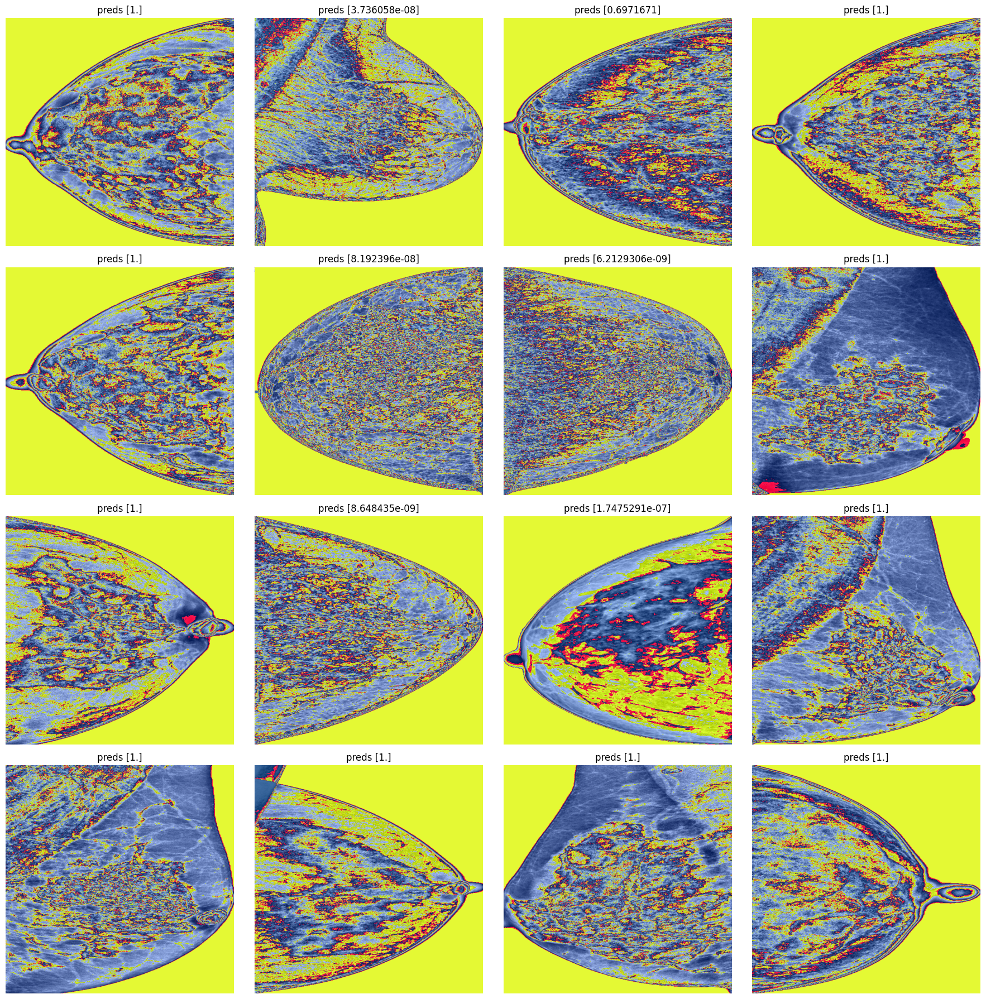

In [ ]:
fig, axs = plt.subplots(4, 4, figsize=(18, 18))

for i in range(4):
  for j in range(4):
      index = i * 4 + j  # Compute the index of the image
      img = imgs[index]  # Get the image data
      heatmap = heatmaps[index]

      overlay = cv2.addWeighted(np.uint8(img.squeeze().permute(1, 2, 0).cpu().numpy() * 255),
                                  1, heatmap, 0.0, 0)

      axs[i, j].imshow(np.uint8(img.squeeze().permute(1, 2, 0).cpu().numpy() * 255), cmap='gray')
      axs[i, j].set_title(f"preds {preds[index][0]}")
      axs[i, j].axis('off')  # Turn off the axis labels

plt.tight_layout()
plt.show()


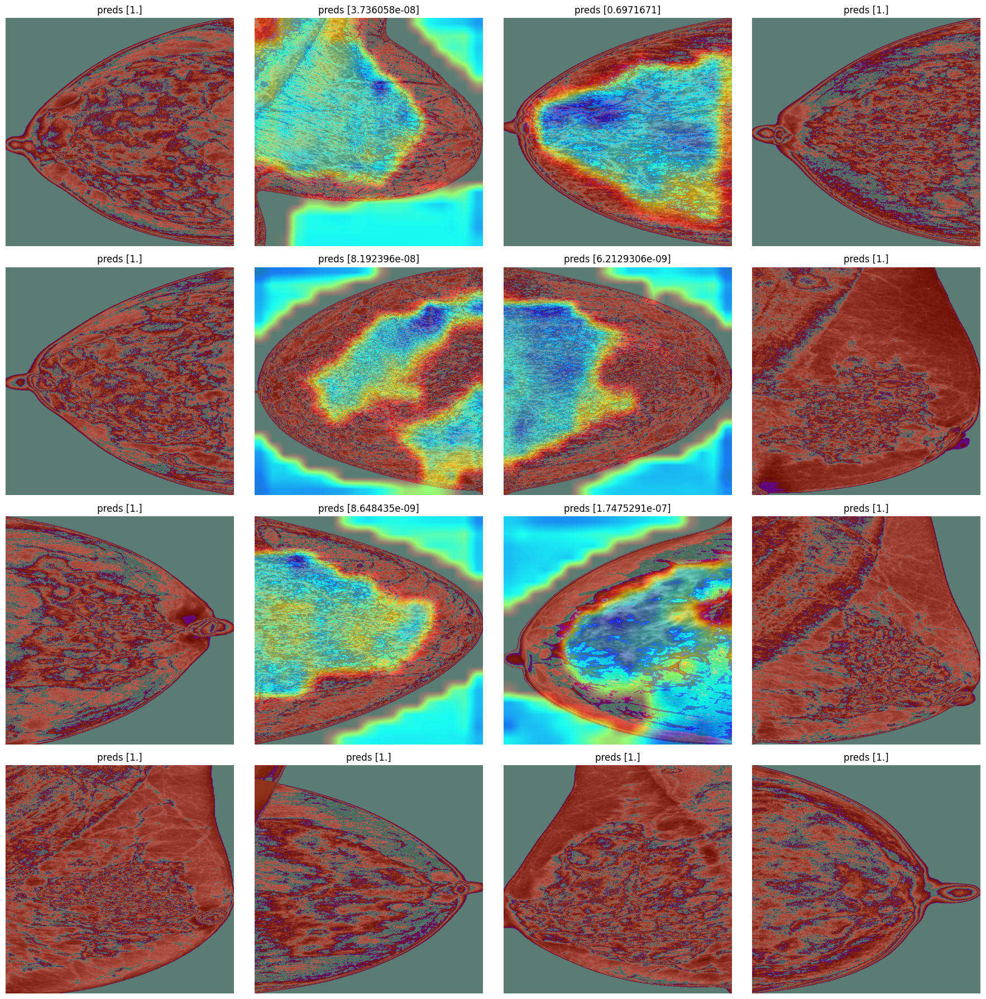

In [ ]:


fig, axs = plt.subplots(4, 4, figsize=(18, 18))

for i in range(4):
    for j in range(4):
        index = i * 4 + j  # Compute the index of the image
        img = imgs[index]  # Get the image data
        heatmap = heatmaps[index]

        center_x = img.shape[2] // 2
        center_y = img.shape[1] // 2

        # Resize the heatmap to match the image dimensions
        resized_heatmap = cv2.resize(heatmap, (img.shape[2], img.shape[1]))

        overlay = cv2.addWeighted(
            cv2.cvtColor(
                np.uint8(img.squeeze().permute(1, 2, 0).cpu().numpy() * 255),
                cv2.COLOR_BGR2RGB),
            0.5,
            resized_heatmap,
            0.5,
            0)

        axs[i, j].imshow(overlay, cmap='gray')
        axs[i, j].set_title(f"preds {preds[index][0]}")
        axs[i, j].axis('off')  # Turn off the axis labels

plt.tight_layout()
plt.show()


300

# Results

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc

y_true = test_data[CFG.target_cols].values
test_data['predictions'] = predictions
y_pred = predictions

cm = confusion_matrix(y_true, np.round(y_pred))




In [ ]:
selected_rows = test_data[(test_data['predictions'] == 1)]
selected_rows

,Patient_id,Cancer,Image_id,Path,predictions
19816,D1-0087,1,D1-0087_1.000000-NA-99089_1-2.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,1.0
20105,D1-0433,1,D1-0433_1.000000-NA-29872_1-2.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,1.0
6789,D1-0683,0,D1-0683_1.000000-NA-07183_1-2.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,1.0
23340,D2-0620,1,D2-0620_1.000000-NA-75737_1-4.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,1.0
22442,D2-0390,1,D2-0390_1.000000-NA-43319_1-3.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,1.0
...,...,...,...,...,...
23451,D2-0650,1,D2-0650_1.000000-NA-60709_1-3.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,1.0
6518,D1-0087,0,D1-0087_1.000000-NA-99089_1-2.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,1.0
21007,D2-0031,1,D2-0031_1.000000-NA-96263_1-2.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,1.0
21828,D2-0236,1,D2-0236_1.000000-NA-94109_1-1.png,/content/drive/MyDrive/Pfe_breast_cancer/Breas...,1.0


In [ ]:
target_names = ['Absence de tumeur', 'Présence de tumeur']
print("Raport de Classification")
print(classification_report(y_true, np.round(y_pred), target_names=target_names))


Raport de Classification
                    precision    recall  f1-score   support

 Absence de tumeur       0.94      0.97      0.95       989
Présence de tumeur       0.85      0.76      0.80       261

          accuracy                           0.92      1250
         macro avg       0.90      0.86      0.88      1250
      weighted avg       0.92      0.92      0.92      1250



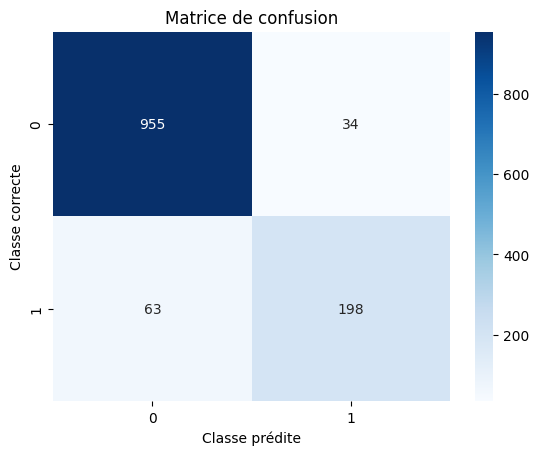

In [ ]:
# Plot confusion matrix using Seaborn
xticklabels = ['0', '1']
yticklabels = ['0', '1']

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=xticklabels, yticklabels=yticklabels)
plt.title('Matrice de confusion')
plt.xlabel('Classe prédite')
plt.ylabel('Classe correcte')
plt.show()

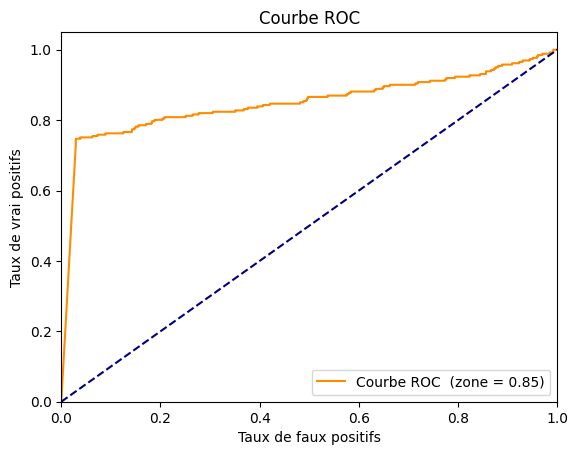

In [ ]:
# ROC curve
fpr, tpr, thresholds = roc_curve(y_true, y_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', label='Courbe ROC  (zone = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taux de faux positifs')
plt.ylabel('Taux de vrai positifs')
plt.title('Courbe ROC')
plt.legend(loc="lower right")
plt.show()


In [ ]:
model_path = '/content/drive/MyDrive/Pfe_breast_cancer/Breast_model/tf_efficientnetv2_s.in21k_ft_in1k_fold_v1_1_best.pth'
test_dataset = TestDataset(test_data_copy, transform=get_transforms(data='valid'))
test_loader = DataLoader(test_dataset, batch_size=CFG.batch_size, shuffle=False,
                         num_workers=CFG.num_workers, pin_memory=True)

model = CustomModel( model_name='tf_efficientnetv2_s', pretrained=False)
model.load_state_dict(torch.load(model_path)['model'])
model.eval()
models = [model.to(device)]
predictions = inference(models, test_loader, device)
test_data_copy[CFG.target_cols] = predictions
test_data_copy[['Image_id'] + CFG.target_cols].to_csv(OUTPUT_DIR+'simpleSubmit.csv', index=False)


  0%|          | 0/105 [00:00<?, ?it/s]

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc

y_true = test_data[CFG.target_cols].values
y_pred = predictions

cm = confusion_matrix(y_true, np.round(y_pred))




In [ ]:
target_names = ['Absence de tumeur', 'Présence de tumeur']
print("Raport de Classification")
print(classification_report(y_true, np.round(y_pred), target_names=target_names))


Raport de Classification
                    precision    recall  f1-score   support

 Absence de tumeur       0.94      0.97      0.95       989
Présence de tumeur       0.87      0.75      0.81       261

          accuracy                           0.92      1250
         macro avg       0.90      0.86      0.88      1250
      weighted avg       0.92      0.92      0.92      1250



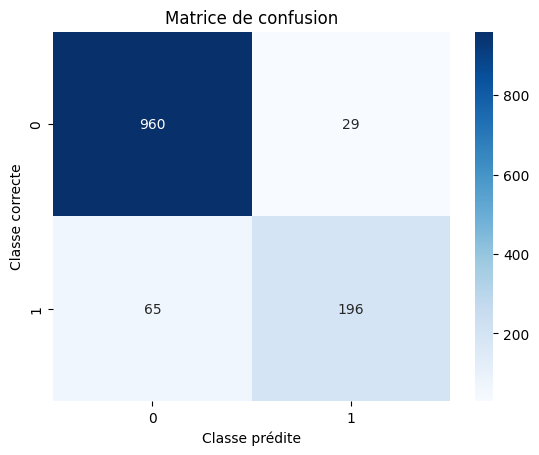

In [ ]:
# Plot confusion matrix using Seaborn
xticklabels = ['0', '1']
yticklabels = ['0', '1']

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=xticklabels, yticklabels=yticklabels)
plt.title('Matrice de confusion')
plt.xlabel('Classe prédite')
plt.ylabel('Classe correcte')
plt.show()

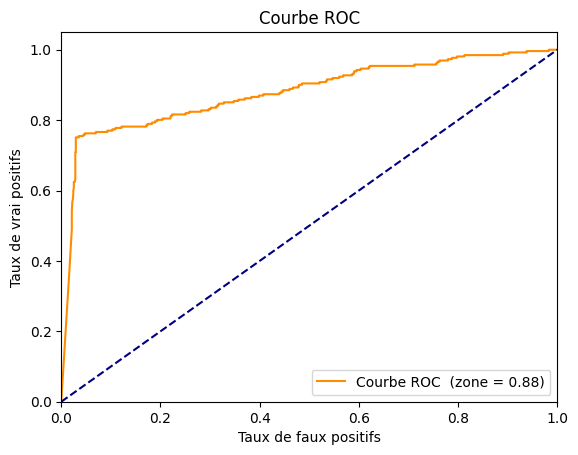

In [ ]:
# ROC curve
fpr, tpr, thresholds = roc_curve(y_true, y_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', label='Courbe ROC  (zone = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taux de faux positifs')
plt.ylabel('Taux de vrai positifs')
plt.title('Courbe ROC')
plt.legend(loc="lower right")
plt.show()


In [ ]:
model_path = '/content/drive/MyDrive/Pfe_breast_cancer/Breast_model/tf_efficientnetv2_s_fold_v1_0_best.pth'
test_dataset = TestDataset(train[:10], transform=get_transforms(data='valid'))
test_loader = DataLoader(test_dataset, batch_size=CFG.batch_size, shuffle=False,
                         num_workers=CFG.num_workers, pin_memory=True)

model = CustomModel( model_name='tf_efficientnetv2_s', pretrained=False)
model.load_state_dict(torch.load(model_path)['model'])
model.eval()

In [ ]:
# pull the gradients out of the model
gradients = model.get_activations_gradient()

# pool the gradients across the channels
print(gradients)
pooled_gradients = torch.mean(gradients, dim=[0, 2, 3])

# get the activations of the last convolutional layer
activations = model.get_activations(test_loader[0]).detach()

# weight the channels by corresponding gradients
for i in range(512):
    activations[:, i, :, :] *= pooled_gradients[i]

# average the channels of the activations
heatmap = torch.mean(activations, dim=1).squeeze()

# relu on top of the heatmap
# expression (2) in https://arxiv.org/pdf/1610.02391.pdf
heatmap = np.maximum(heatmap, 0)

# normalize the heatmap
heatmap /= torch.max(heatmap)

# draw the heatmap
plt.matshow(heatmap.squeeze())

In [ ]:
model_path = ['/content/drive/MyDrive/Pfe_breast_cancer/Breast_model/tf_efficientnetv2_s_fold_v1_0_best.pth','','']
test_dataset = TestDataset(train[:10], transform=get_transforms(data='valid'))
test_loader = DataLoader(test_dataset, batch_size=CFG.batch_size, shuffle=False,
                         num_workers=CFG.num_workers, pin_memory=True)
e = 0
model = CustomModel( model_name='tf_efficientnetv2_s', pretrained=False)
for i in model_path:
  e = e + 1
  model.load_state_dict(torch.load(i)['model'])
  model.eval()
  models = [model.to(device)]
  gradients = model.get_activations_gradient()
  print(gradients)
  predictions = inference(models, test_loader, device)
  train[CFG.target_cols][:10] = predictions
  train[['Image_id'] + CFG.target_cols].to_csv(OUTPUT_DIR+'TFV3'+str(e)+'Submission.csv', index=False)

